# What does the search space look like at a large step size?

In [7]:
import glob
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import scipy
import sys

from datetime import datetime

sys.path.append('../../feeg_fmri_sync')

from feeg_fmri_sync.plotting import (
    display_plot,
    generate_latex_label,
    plot_all_search_results_2d_on_same_colormap,
    plot_eeg_hdr_across_delta_tau_alpha_range,
    plot_local_minima,
)
from feeg_fmri_sync.search import (
    build_models,
    search_voxels
)
from feeg_fmri_sync.simulations import (
    build_model_to_fmri,
    generate_downsampled_simulated_fmri,
)
from feeg_fmri_sync.utils import (
    generate_descriptions_from_search_df,
)
from feeg_fmri_sync.vectorized_models import VectorizedHemodynamicModel

## Initialize constants for Hemodynamic Modeling

In [2]:
### Initialize constants ###
sample_freq = 20
tr = 800
n_trs_skipped_at_beginning = 0
hemodynamic_response_window = 30

# Actual Values to generate data from
expected_delta = 2.55
expected_tau=2.55
expected_alpha=2.55

# Initalize Analysis Variables
step_size = 0.25

delta = np.arange(0.05, 10+step_size, step_size)
tau = np.arange(0.05, 10+step_size, step_size)
alpha = np.arange(0.05, 6+step_size, step_size)

print(f'Delta target: {expected_delta}, Range:\n{delta}\n')
print(f'Tau target: {expected_tau}, Range:\n{tau}\n')
print(f'Alpha target: {expected_alpha}, Range:\n{alpha}\n')

Delta target: 2.55, Range:
[ 0.05  0.3   0.55  0.8   1.05  1.3   1.55  1.8   2.05  2.3   2.55  2.8
  3.05  3.3   3.55  3.8   4.05  4.3   4.55  4.8   5.05  5.3   5.55  5.8
  6.05  6.3   6.55  6.8   7.05  7.3   7.55  7.8   8.05  8.3   8.55  8.8
  9.05  9.3   9.55  9.8  10.05]

Tau target: 2.55, Range:
[ 0.05  0.3   0.55  0.8   1.05  1.3   1.55  1.8   2.05  2.3   2.55  2.8
  3.05  3.3   3.55  3.8   4.05  4.3   4.55  4.8   5.05  5.3   5.55  5.8
  6.05  6.3   6.55  6.8   7.05  7.3   7.55  7.8   8.05  8.3   8.55  8.8
  9.05  9.3   9.55  9.8  10.05]

Alpha target: 2.55, Range:
[0.05 0.3  0.55 0.8  1.05 1.3  1.55 1.8  2.05 2.3  2.55 2.8  3.05 3.3
 3.55 3.8  4.05 4.3  4.55 4.8  5.05 5.3  5.55 5.8  6.05]



## Comparing Related EEGs  

### Initialize constants for simulation

In [3]:
# Plot the generated data
# NOTE: only the first of the trials will be plotted
plot_generated_data = True

# Plot perfect data when modeling
plot_perfect_comparison = True

# noises to examine and plot when modeling
noise_range = np.arange(1, 17, step=3)
noises_to_plot = [4, 10, 16]

# trials we run for each condition and how many trials to plot when modeling
num_trials = 100
num_trials_to_plot = 1

# models to examine
models_to_test = [
    {
        'name': 'downsample',
        'model': VectorizedHemodynamicModel,
        'fmri_data_generator': generate_downsampled_simulated_fmri,
    }
]

# eeg data types to use
eeg_data_options_for_fmri_generation = ['without_nans']
eeg_data_options_for_simulation = ['without_nans']

# filename to save data to
filename_substring = f'large_search_space_delta{expected_delta}_tau{expected_tau}_alpha{expected_alpha}'
filename_ext = '.csv'
plot = True

### Initialize Analysis variables

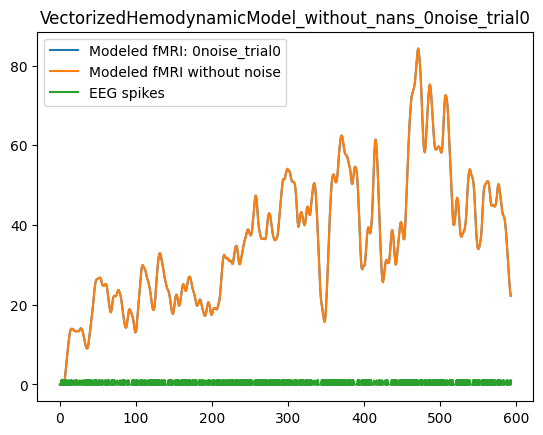

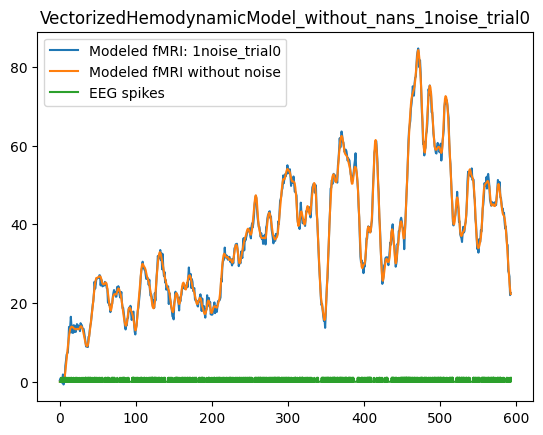

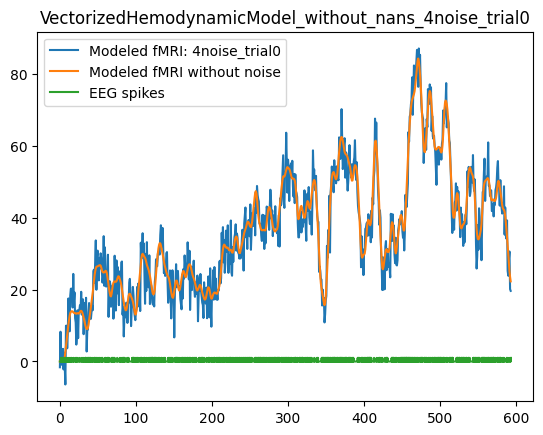

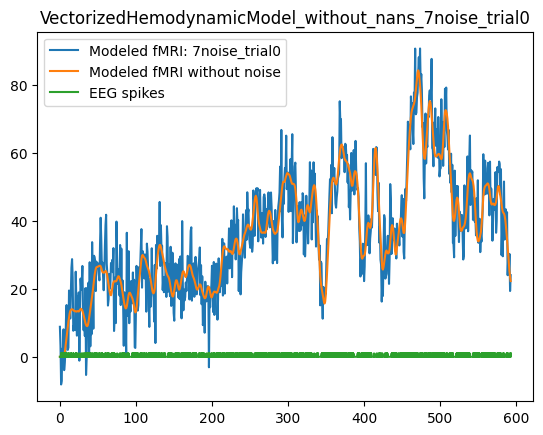

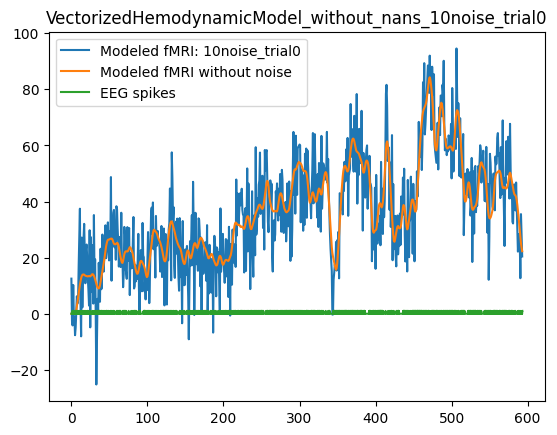

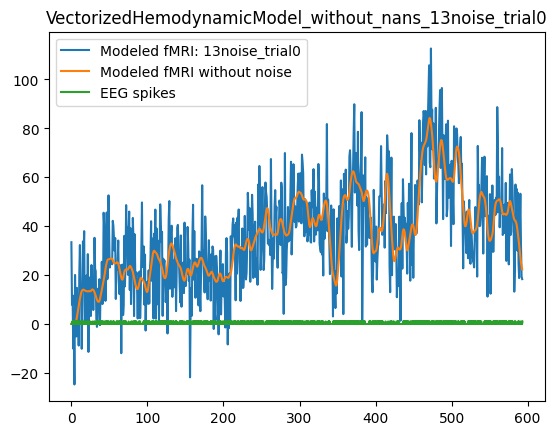

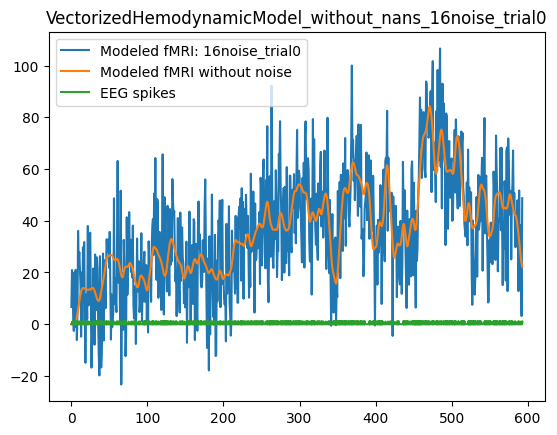

In [4]:
# Generate fMRI data
model_to_fmri = build_model_to_fmri(
    models_to_test,
    eeg_data_options_for_fmri_generation,
    expected_delta,
    expected_tau,
    expected_alpha,
    num_trials,
    num_trials_to_plot,
    noise_range,
    noises_to_plot,
    plot_perfect_comparison,
    tr,
    sample_freq,
    hemodynamic_response_window,
    plot_generated_data
)

models = build_models(
    model_to_fmri,
    eeg_data_options_for_simulation,
    tr, 
    n_trs_skipped_at_beginning,
    sample_freq,
    hemodynamic_response_window,
    plot
)

### Plot Expected HDR against Noise HDR,  and Display EEG HDR across Search Space

Scoring downsample_without_nans_without_nans delta=2.55, tau=2.55, alpha=2.55


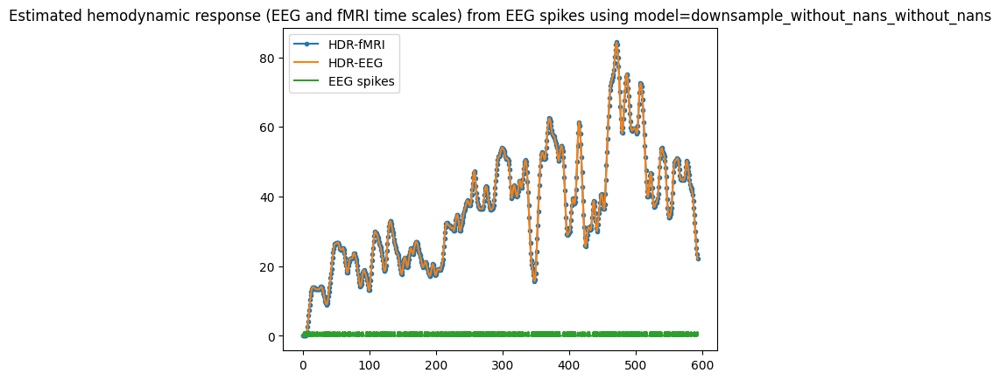

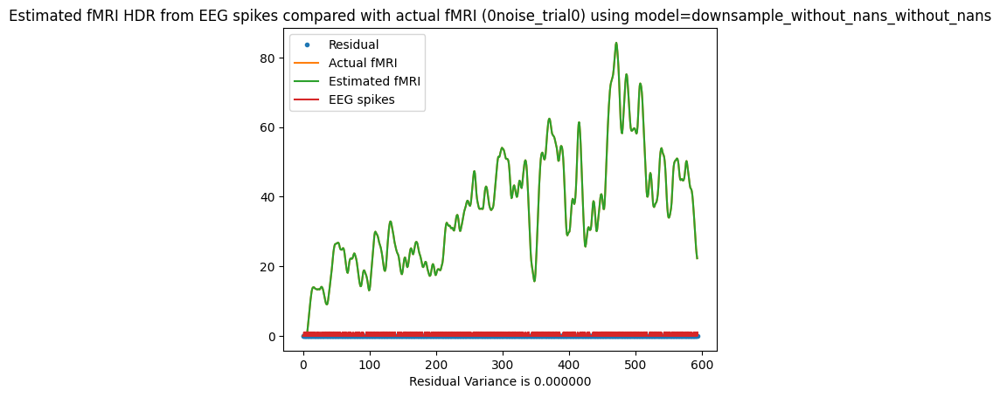

Residual Variance is 0.000000


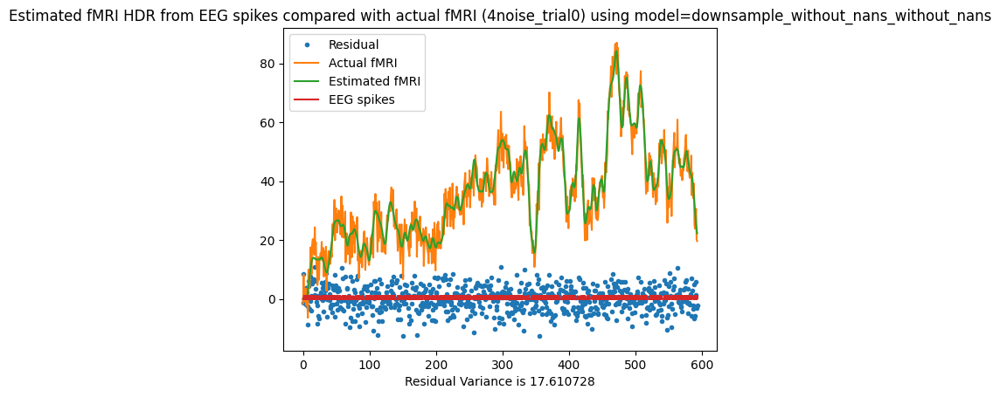

Residual Variance is 17.610728


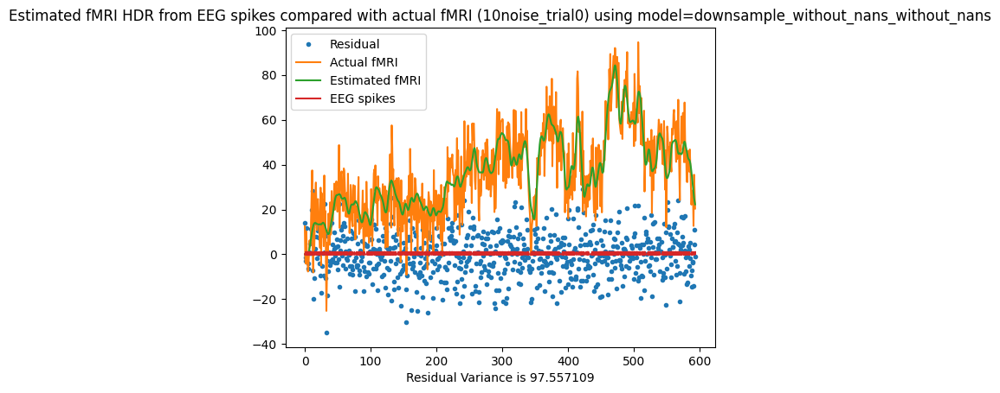

Residual Variance is 97.557109


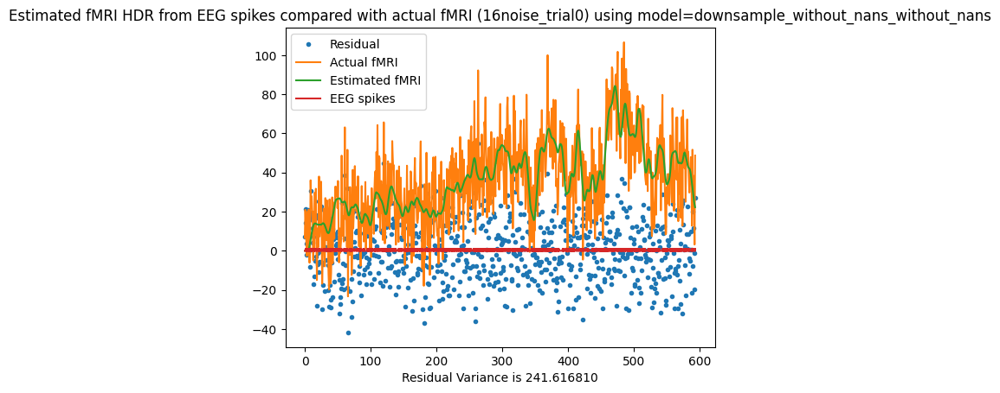

Residual Variance is 241.616810


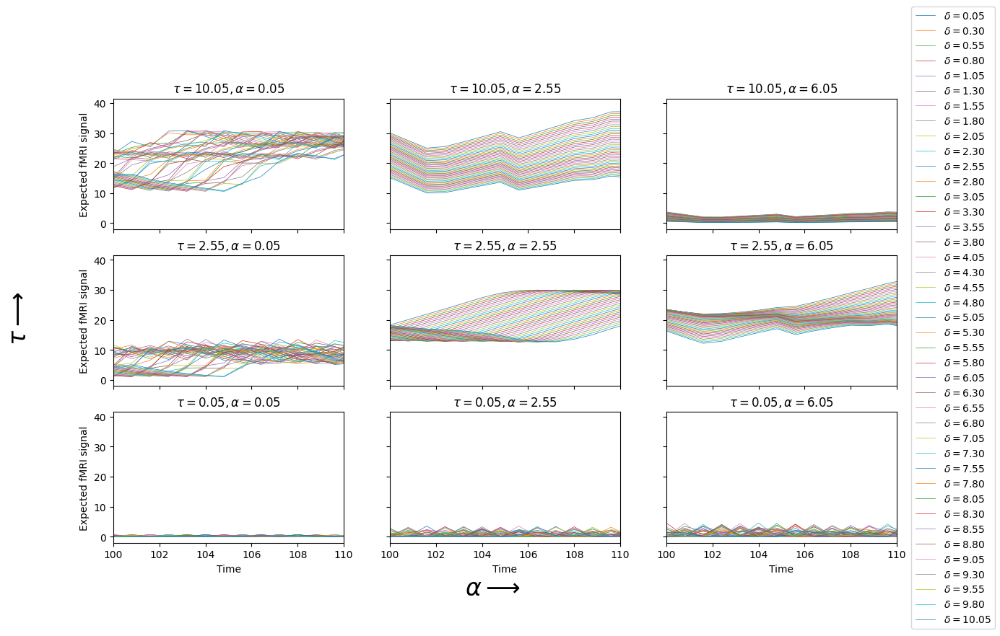

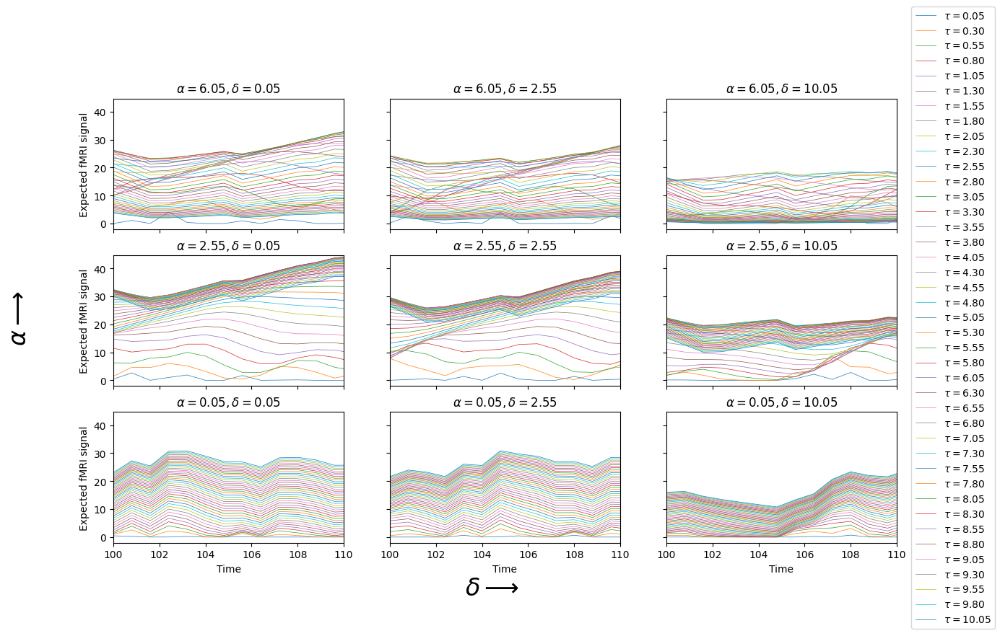

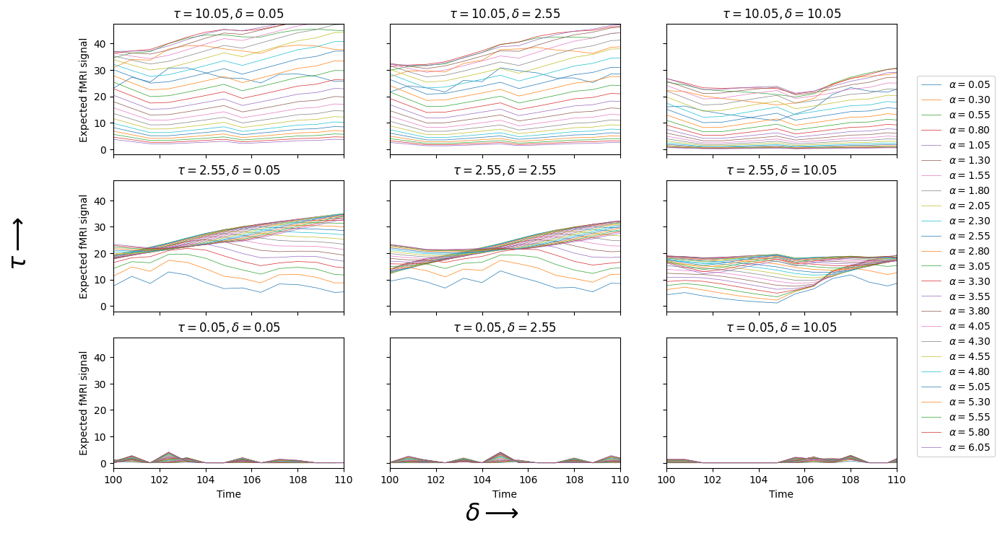

In [5]:
# Get in-depth plots for actual delta, tau, alpha
for model_name, model in models.items():
    residual_var = model.score(expected_delta, expected_tau, expected_alpha)
    fmri_names = np.array(model.fmri.voxel_names)
    model.plot = False
    display_plot(
        plot_eeg_hdr_across_delta_tau_alpha_range, 
        model.eeg,
        hemodynamic_response_window, 
        tr,
        delta,
        tau,
        alpha,
        mid_delta=expected_delta,
        mid_tau=expected_tau,
        mid_alpha=expected_alpha,
        x_start=100
    )



Found previously run data. Enter name to reuse or "none" to recalculate.
['large_search_space_delta2.55_tau2.55_alpha2.55_2023-04-17_12:48.csv', 'large_search_space_delta2.55_tau2.55_alpha2.55_2023-04-17_15:20.csv']
Default (large_search_space_delta2.55_tau2.55_alpha2.55_2023-04-17_15:20.csv)

Loading data from large_search_space_delta2.55_tau2.55_alpha2.55_2023-04-17_15:20.csv...
Minimal Cost for Average Cost: noise 0 (downsample_without_nans_without_nans) = 1.2221266472699286e-27; at
       delta   tau  alpha
10510   2.55  2.55   2.55


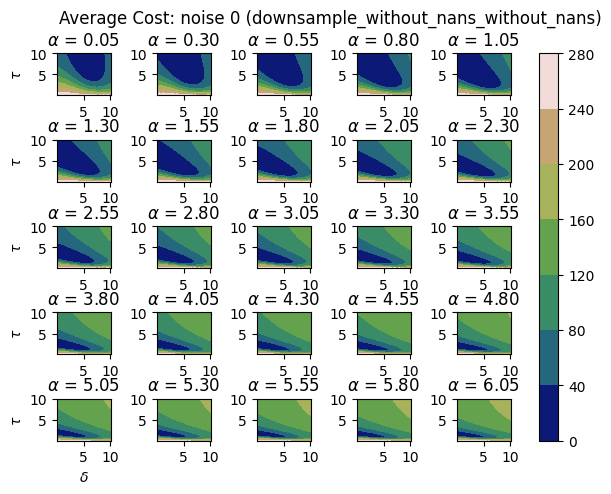

Minimal Cost for Average Cost: noise 1 (downsample_without_nans_without_nans) = 0.9995981274558956; at
       delta   tau  alpha
10510   2.55  2.55   2.55


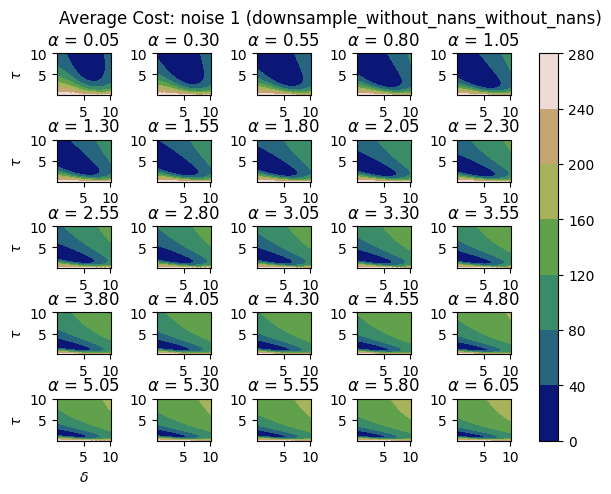

Minimal Cost for Average Cost: noise 4 (downsample_without_nans_without_nans) = 16.037414684038612; at
       delta   tau  alpha
10510   2.55  2.55   2.55


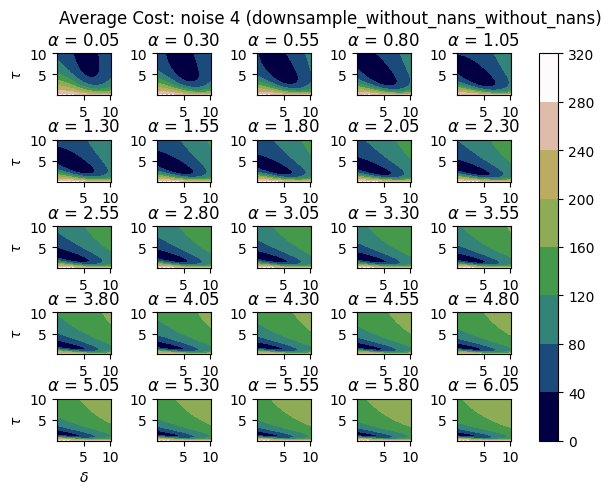

Minimal Cost for Average Cost: noise 7 (downsample_without_nans_without_nans) = 48.88397716971356; at
       delta   tau  alpha
10510   2.55  2.55   2.55


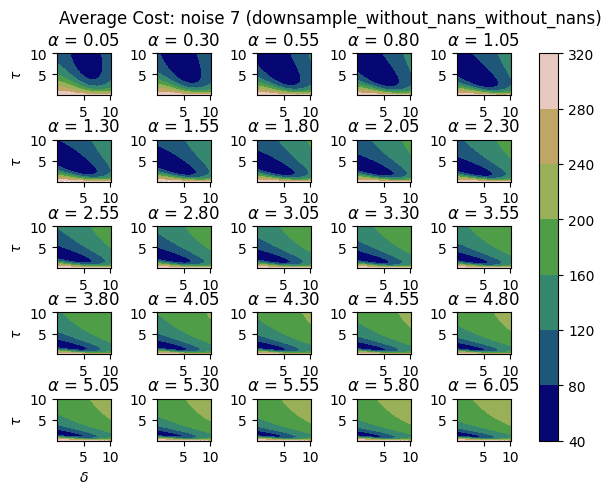

Minimal Cost for Average Cost: noise 10 (downsample_without_nans_without_nans) = 99.35633710178647; at
       delta   tau  alpha
10510   2.55  2.55   2.55


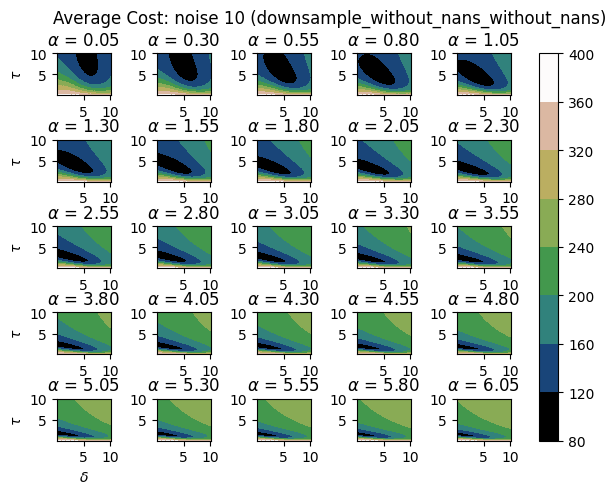

Minimal Cost for Average Cost: noise 13 (downsample_without_nans_without_nans) = 169.74354332546955; at
       delta   tau  alpha
10510   2.55  2.55   2.55


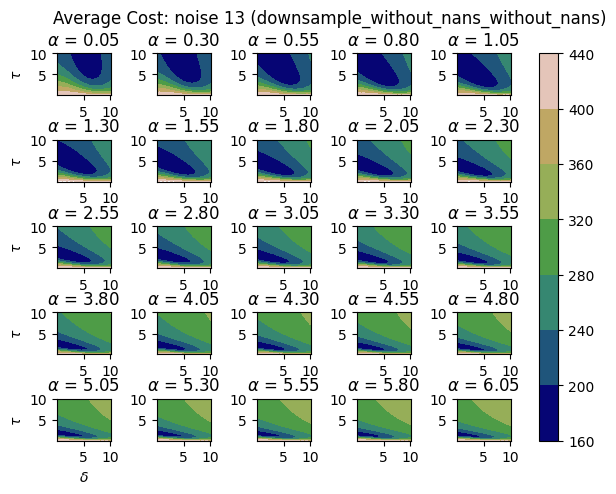

Minimal Cost for Average Cost: noise 16 (downsample_without_nans_without_nans) = 253.62225896457986; at
       delta   tau  alpha
10510   2.55  2.55   2.55


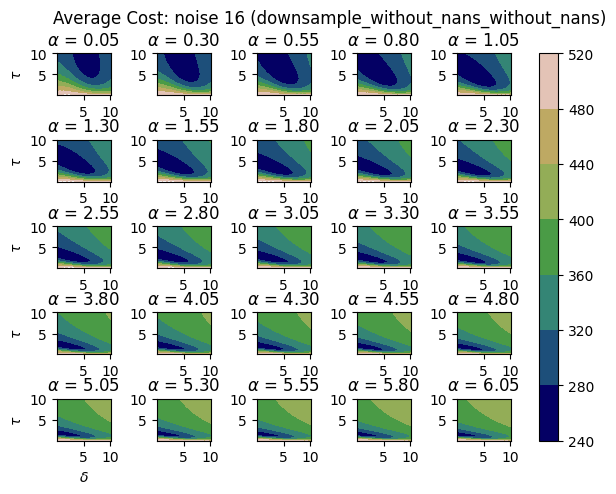

,delta,tau,alpha,model_name,0noise_trial0,1noise_trial0,4noise_trial0,7noise_trial0,10noise_trial0,13noise_trial0,...,7noise_trial98,10noise_trial98,13noise_trial98,16noise_trial98,1noise_trial99,4noise_trial99,7noise_trial99,10noise_trial99,13noise_trial99,16noise_trial99
0,0.05,0.05,0.05,downsample_without_nans_without_nans,272.110070,272.503648,288.465045,316.156996,387.842471,444.833345,...,326.590550,369.470465,472.640021,531.575037,274.690885,290.032686,317.119623,343.622050,452.917146,493.368362
1,0.05,0.05,0.30,downsample_without_nans_without_nans,271.589690,271.992238,287.971768,315.529850,387.399754,444.071976,...,326.049497,368.890242,471.978594,531.131287,274.156513,289.533243,316.683199,343.173994,452.625820,492.609065
2,0.05,0.05,0.55,downsample_without_nans_without_nans,270.963540,271.376961,287.364167,314.784204,386.849009,443.182020,...,325.397526,368.180178,471.145783,530.638391,273.514785,288.930956,316.160898,342.635528,452.245868,491.790057
3,0.05,0.05,0.80,downsample_without_nans_without_nans,270.227684,270.653829,286.633634,313.921308,386.179879,442.169275,...,324.630663,367.332399,470.116715,530.106547,272.761915,288.220830,315.550742,342.002839,451.759253,490.943917
4,0.05,0.05,1.05,downsample_without_nans_without_nans,269.387639,269.828016,285.781674,312.955350,385.390973,441.053011,...,323.755221,366.351267,468.876141,529.549868,271.903572,287.406435,314.858708,341.279741,451.151304,490.114062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42020,10.05,10.05,5.05,downsample_without_nans_without_nans,164.514657,165.291405,181.688149,204.751923,269.259453,344.288821,...,215.293257,252.577583,356.847747,428.740239,165.874688,180.472791,207.335754,248.035705,332.773202,389.412650
42021,10.05,10.05,5.30,downsample_without_nans_without_nans,166.884610,167.672052,183.990645,207.123819,271.607422,346.560503,...,217.890581,254.919255,359.699103,431.118809,168.255539,182.824287,209.676763,249.961543,335.415994,391.961154
42022,10.05,10.05,5.55,downsample_without_nans_without_nans,169.135708,169.932283,186.181439,209.385259,273.840051,348.724244,...,220.365559,257.145232,362.415091,433.376621,170.518104,185.055298,211.907700,251.791501,337.928923,394.374018
42023,10.05,10.05,5.80,downsample_without_nans_without_nans,171.276702,172.081038,188.268428,211.543411,275.965834,350.788196,...,222.726088,259.264277,365.004572,435.523185,172.670975,187.174880,214.036551,253.533059,340.320971,396.660290


In [8]:
df = pd.DataFrame()
data = []

matching_files = sorted(glob.glob(f'{filename_substring}*{filename_ext}'))
filename_to_use = "none"
if len(matching_files) != 0:
    filename_to_use = input(
        f'Found previously run data. Enter name to reuse or "none" to recalculate.'
        f'\n{matching_files}\nDefault ({matching_files[-1]})\n'
    )
if filename_to_use.lower() != "none":
    if filename_to_use.strip() == '':
        filename_to_use = matching_files[-1]
    print(f'Loading data from {filename_to_use}...')
    with open(filename_to_use, 'r') as f:
        df = pd.read_csv(f, index_col=0)
        assert len(df['model_name'].unique()) == 1
        df_to_plot = df.drop(columns='model_name').astype(float)

        for noise in np.concatenate([[0], noise_range]):
            columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
            columns_for_noise = df_to_plot.columns[columns_to_choose]

            average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
            average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
            display_plot(plot_all_search_results_2d_on_same_colormap, average_df)

            # Grab parameters with the minimum cost
            minimum_cost_mask = df_to_plot[columns_for_noise] == df_to_plot[columns_for_noise].min()
            minimum_cost_array = df_to_plot[columns_for_noise][minimum_cost_mask].to_numpy()

            for point in zip(*np.where(~np.isnan(minimum_cost_array))):
                row_of_interest = df_to_plot.iloc[point[0]]
                data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])


if df.empty:
    print('Generating data!')
    descriptions, df = search_voxels(models, delta, tau, alpha)
    with open(f'{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}', 'w') as f:
        pd.DataFrame(df).to_csv(f)
    for model_name, description in zip(models.keys(), descriptions):
        description_filename = os.path.join(
            'Descriptions',
            f'{model_name}_summary_{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}'
        )
        with open(description_filename, 'w') as f:
            pd.DataFrame(description).transpose().to_csv(f)
    assert len(df['model_name'].unique()) == 1
    df_to_plot = df.drop(columns='model_name').astype(float)

    for noise in np.concatenate([[0], noise_range]):
        columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
        columns_for_noise = df_to_plot.columns[columns_to_choose]

        average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
        average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
        display_plot(plot_all_search_results_2d_on_same_colormap, average_df)

        # Grab parameters with the minimum cost
        minimum_cost_mask = df_to_plot[columns_for_noise] == df_to_plot[columns_for_noise].min()
        minimum_cost_array = df_to_plot[columns_for_noise][minimum_cost_mask].to_numpy()

        for point in zip(*np.where(~np.isnan(minimum_cost_array))):
            row_of_interest = df_to_plot.iloc[point[0]]
            data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

df

### Cost by Noise

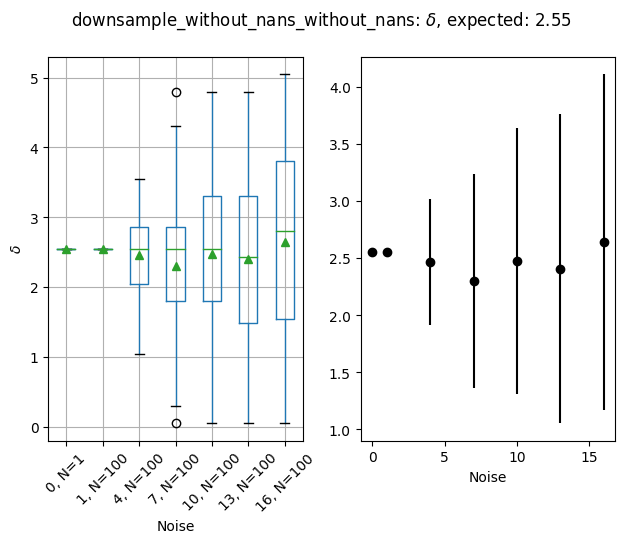

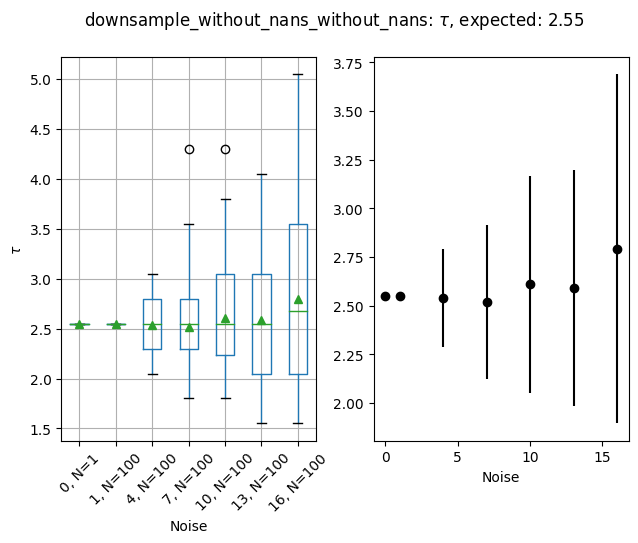

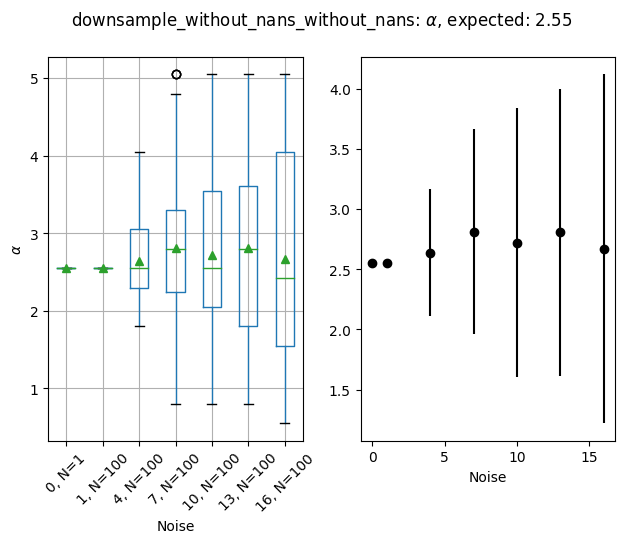

In [44]:
chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable, expected_val in [('delta', expected_delta), ('tau', expected_tau), ('alpha', expected_alpha)]:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(f'{model_name}: {generate_latex_label(variable)}, expected: {expected_val}')
    fig.tight_layout()
    axs[0].set_ylabel(generate_latex_label(variable))
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(
        np.concatenate([[0], noise_range]), 
        chosen_points.mean()[variable], 
        chosen_points.std()[variable], fmt='ok'
    )
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

## Randomized

In [45]:
# Plot the generated data
# NOTE: only the first of the trials will be plotted
plot_generated_data = False

# Plot perfect data when modeling
plot_perfect_comparison = True

# noises to examine and plot when modeling
noise_range = np.arange(1, 17, step=3)
noises_to_plot = [4, 10, 16]

# trials we run for each condition and how many trials to plot when modeling
num_trials = 100
num_trials_to_plot = 1

# models to examine
models_to_test = [
    {
        'name': 'downsample',
        'model': VectorizedHemodynamicModel,
        'fmri_data_generator': generate_downsampled_simulated_fmri,
    }
]

num_models = 10
num_models_to_generate = num_models

# eeg data types to use
eeg_data_options_for_fmri_generation = ['random']
eeg_data_options_for_simulation = ['without_nans']

filename_substring = f'RANDOM_large_search_space_delta{expected_delta}_tau{expected_tau}_alpha{expected_alpha}'
filename_ext = '.csv'
plot = True


### Load available datasets and plot Search Space Heatmap 

In [46]:
# Reuse whatever exists
data = []

matching_files = sorted(glob.glob(f'{filename_substring}*{filename_ext}'))
if len(matching_files) > 0:
    for filename_to_use in matching_files:
        if num_models_to_generate <= 0:
            continue
        num_models_to_generate -= 1
        print(f'Loading data from {filename_to_use}...')
        with open(filename_to_use, 'r') as f:
            df = pd.read_csv(f, index_col=0)
            assert len(df['model_name'].unique()) == 1
            df_to_plot = df.drop(columns='model_name').astype(float)
            
            for noise in np.concatenate([[0], noise_range]):
                columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
                columns_for_noise = df_to_plot.columns[columns_to_choose]

                average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
                average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
                display_plot(plot_all_search_results_2d_on_same_colormap, average_df)

                # Grab parameters with the minimum cost
                minimum_cost_mask = df_to_plot[columns_for_noise] == df_to_plot[columns_for_noise].min()
                minimum_cost_array = df_to_plot[columns_for_noise][minimum_cost_mask].to_numpy()

                for point in zip(*np.where(~np.isnan(minimum_cost_array))):
                    row_of_interest = df_to_plot.iloc[point[0]]
                    data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise, num_models_to_generate])


### Est vs Actual (at generated points) and plot Search Space Heatmap 

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


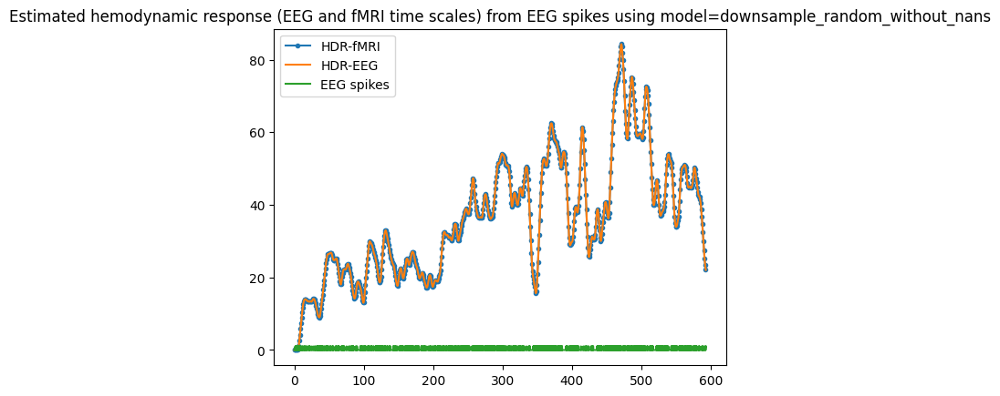

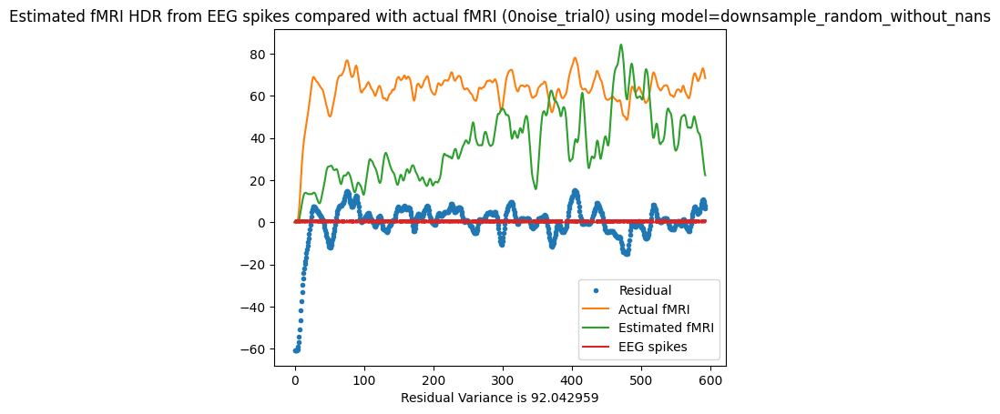

Residual Variance is 92.042959


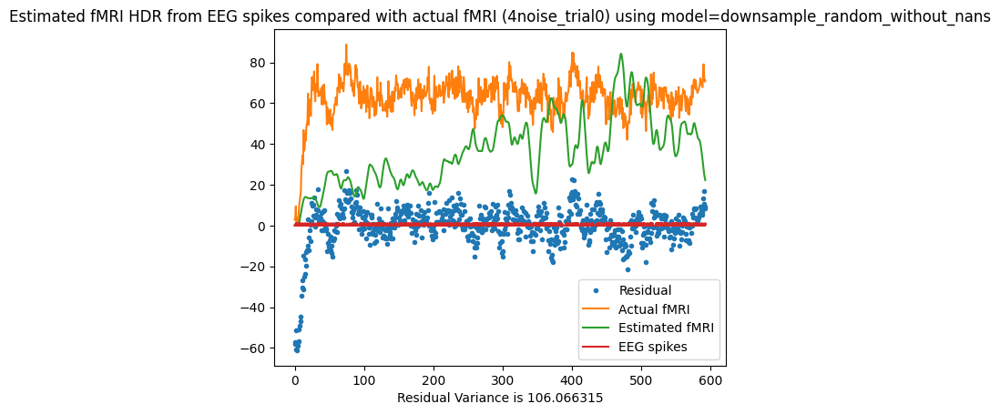

Residual Variance is 106.066315


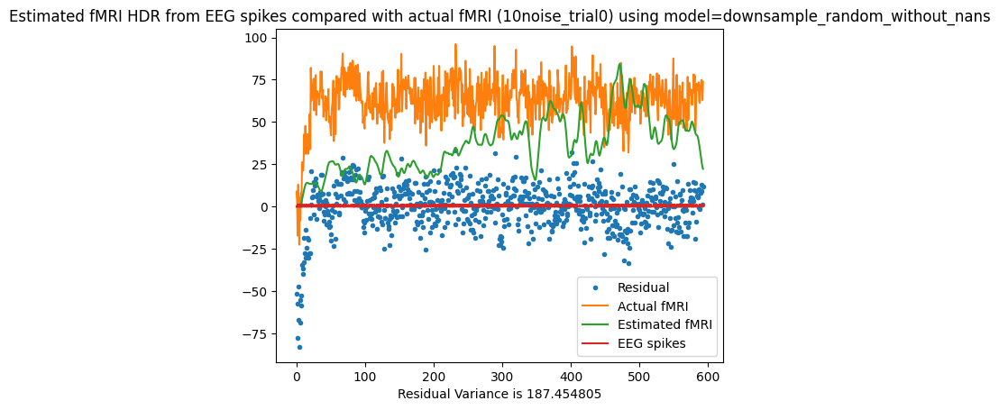

Residual Variance is 187.454805


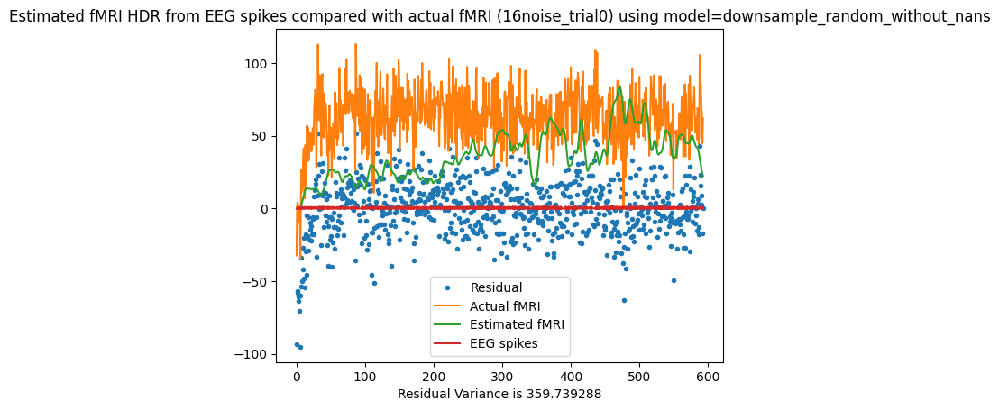

Residual Variance is 359.739288
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.39 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.38 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 3.37 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.49 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.62 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 3.72 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 3.81 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 3.77 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 3.83 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 3.76 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 3.87 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 3.99 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 3.84 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 3.94 seconds
De

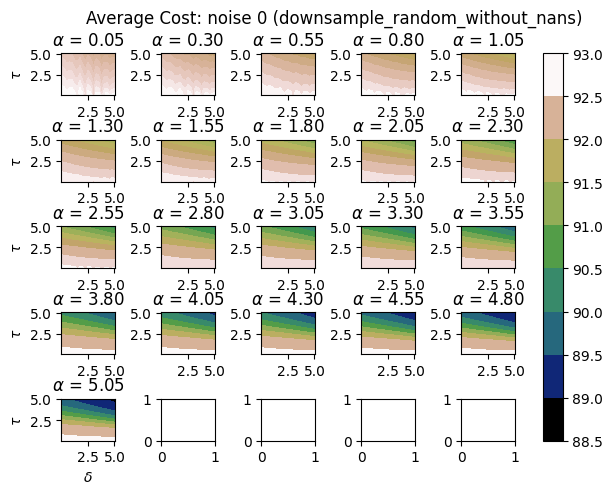

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 89.96738965419262; at
      delta   tau  alpha
9260   5.05  5.05   5.05


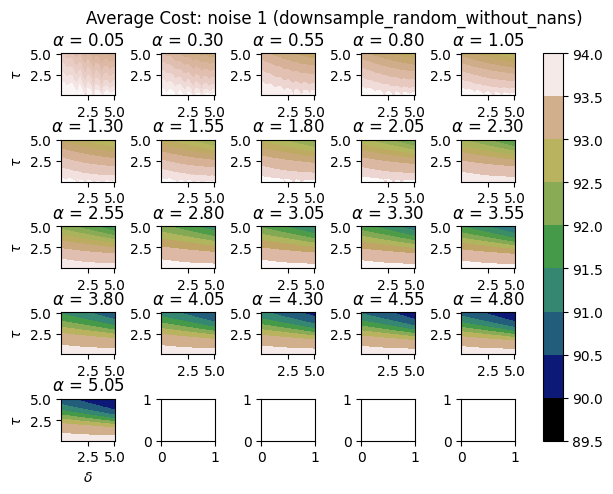

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 105.45282641518166; at
      delta   tau  alpha
9260   5.05  5.05   5.05


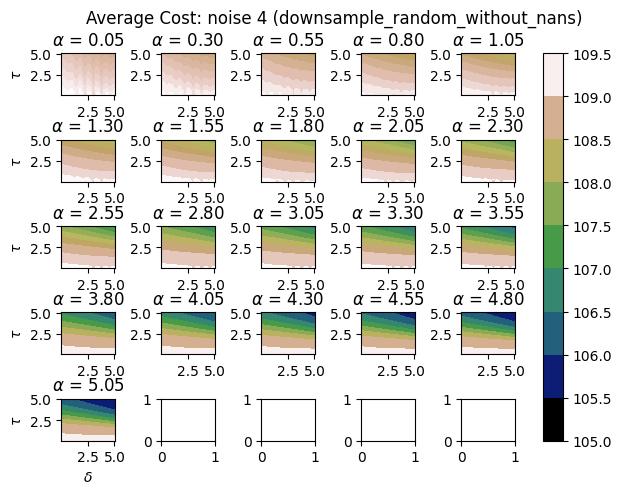

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 137.6687398139737; at
      delta   tau  alpha
9260   5.05  5.05   5.05


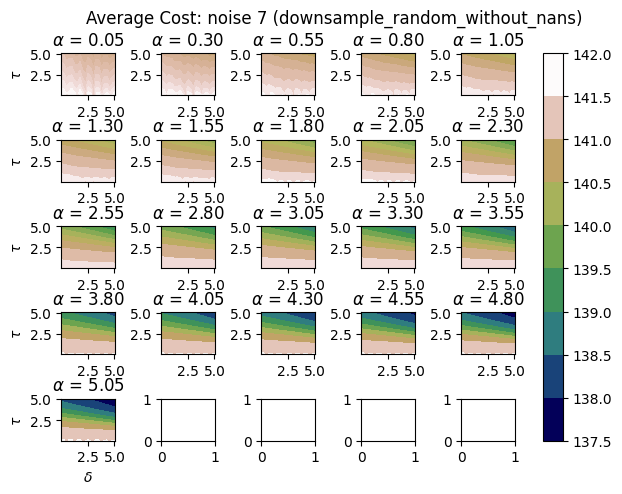

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 189.6352303941068; at
      delta   tau  alpha
9260   5.05  5.05   5.05


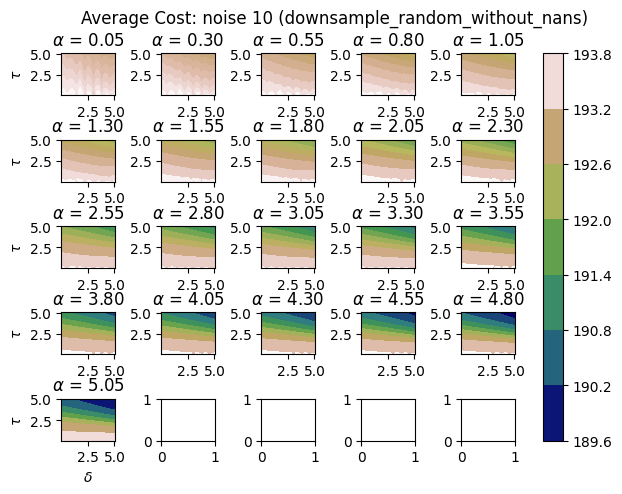

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 256.62461067454313; at
      delta   tau  alpha
9260   5.05  5.05   5.05


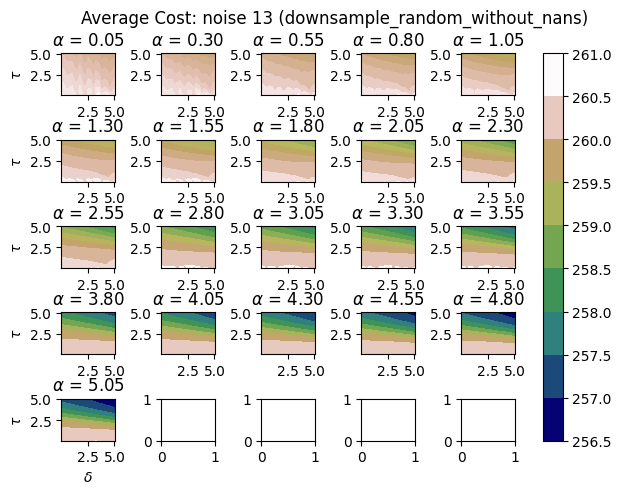

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 345.7606252142495; at
      delta   tau  alpha
9260   5.05  5.05   5.05


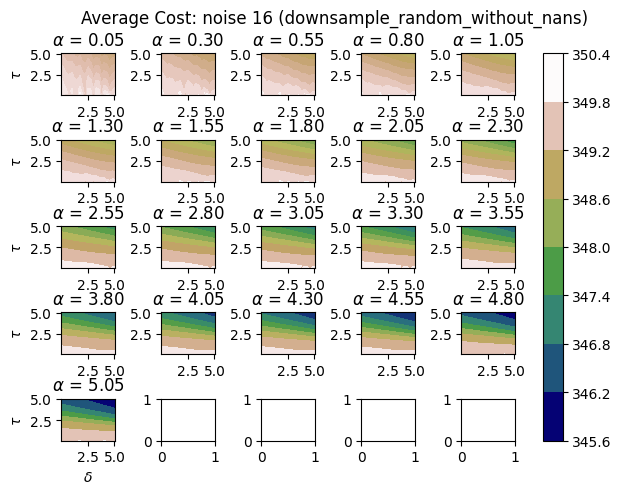

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


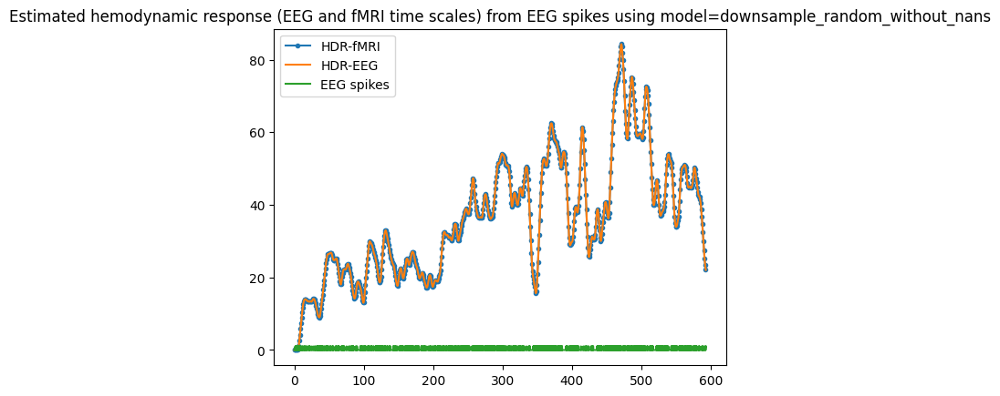

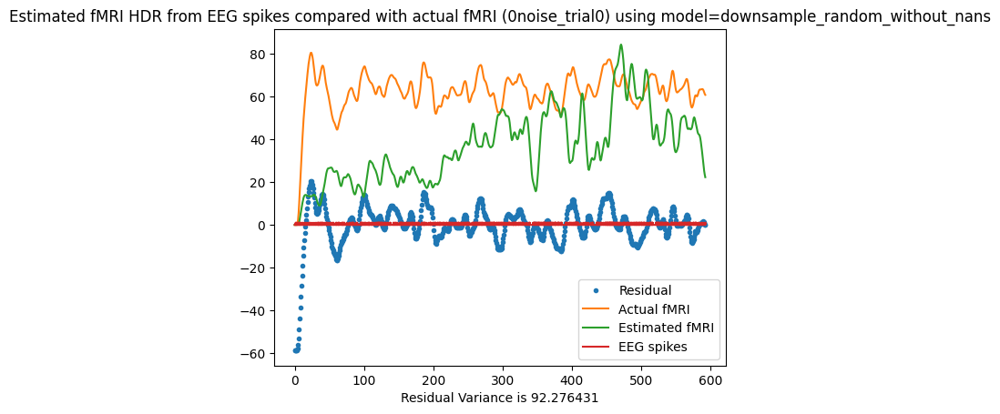

Residual Variance is 92.276431


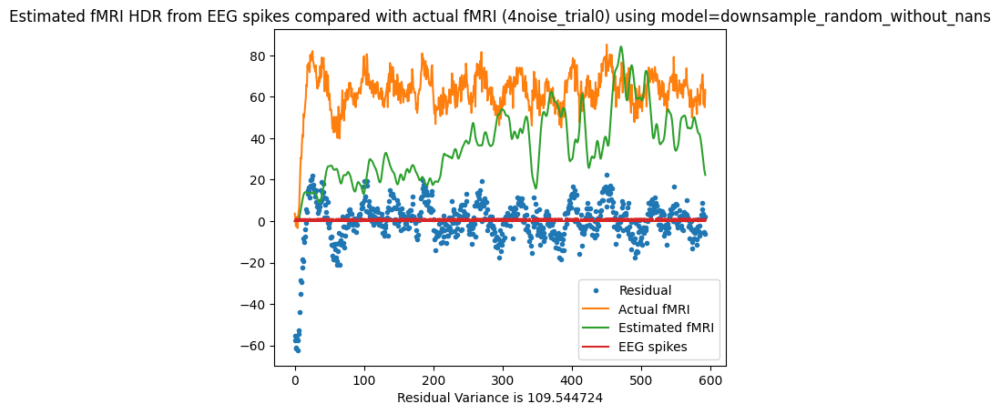

Residual Variance is 109.544724


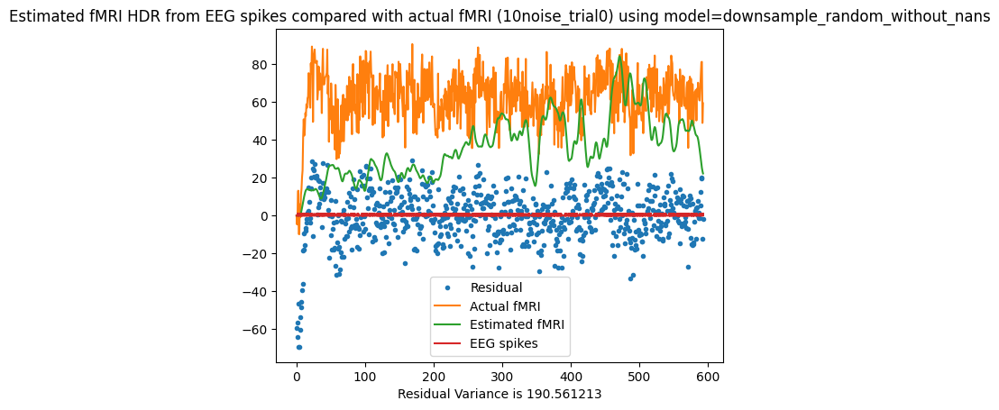

Residual Variance is 190.561213


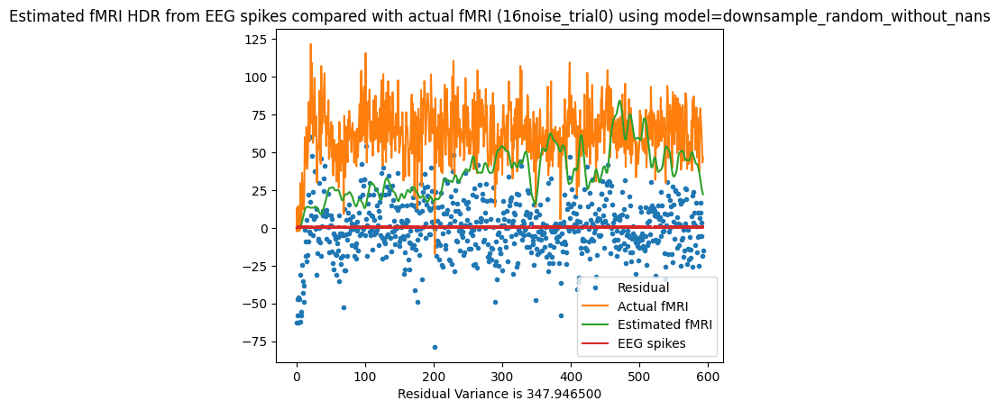

Residual Variance is 347.946500
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.38 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.41 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 3.65 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.83 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.85 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 3.90 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 3.96 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 3.81 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 3.83 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 3.84 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 3.88 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 3.95 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 3.88 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 3.84 seconds
De

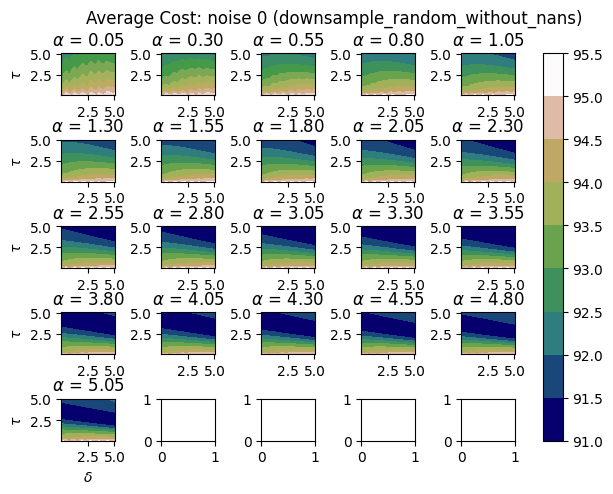

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 92.12120917692366; at
      delta  tau  alpha
9029   5.05  2.3   5.05


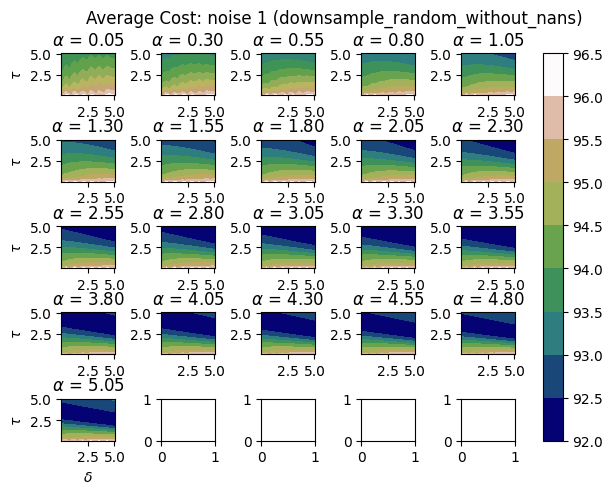

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 107.55877899135835; at
      delta  tau  alpha
9029   5.05  2.3   5.05


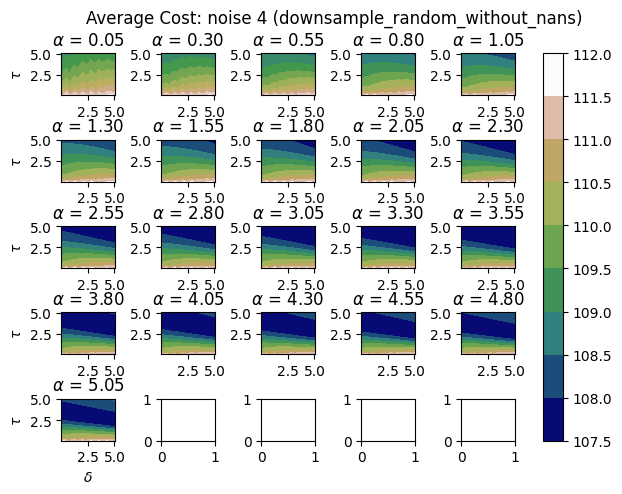

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 139.46280814842342; at
      delta  tau  alpha
9029   5.05  2.3   5.05


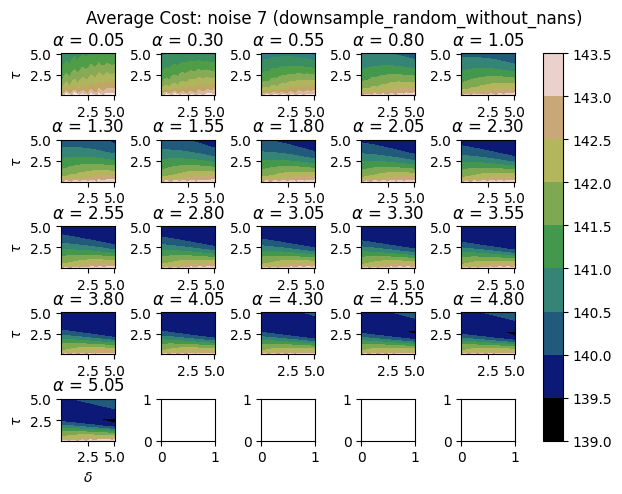

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 191.3189245578289; at
      delta   tau  alpha
9050   5.05  2.55   5.05


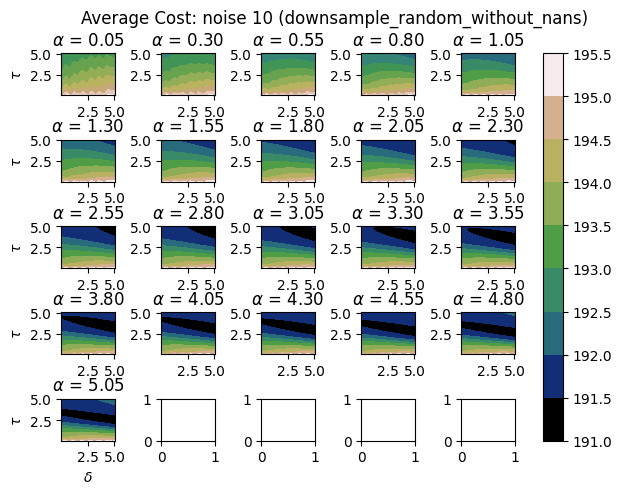

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 260.4383806085918; at
      delta  tau  alpha
9029   5.05  2.3   5.05


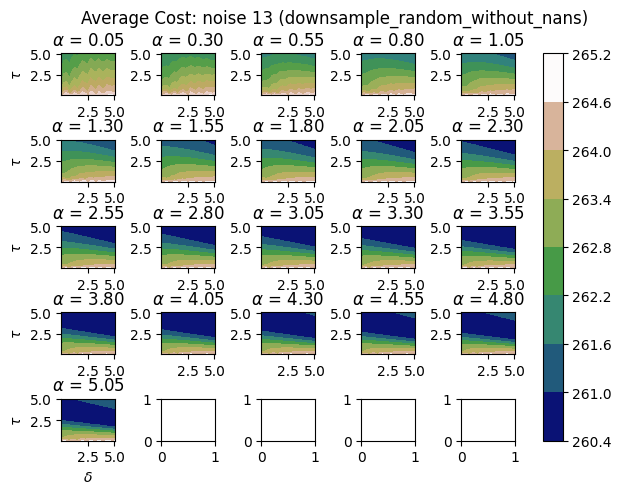

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 347.78652165076033; at
      delta  tau  alpha
9029   5.05  2.3   5.05


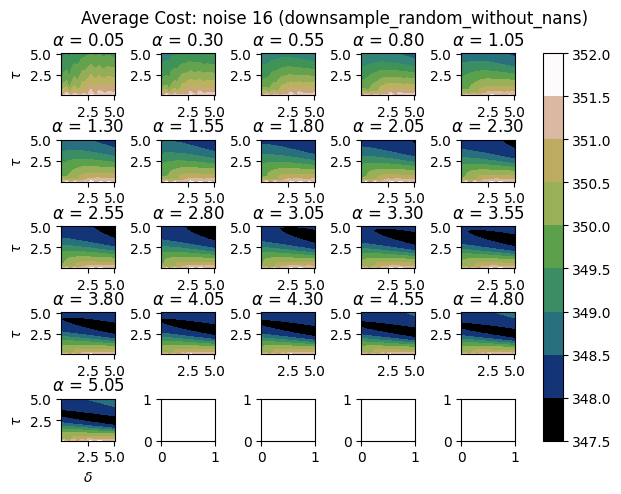

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


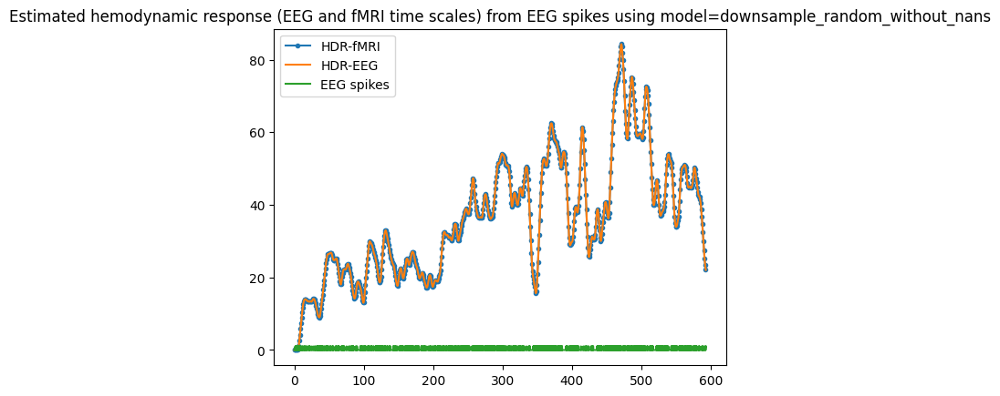

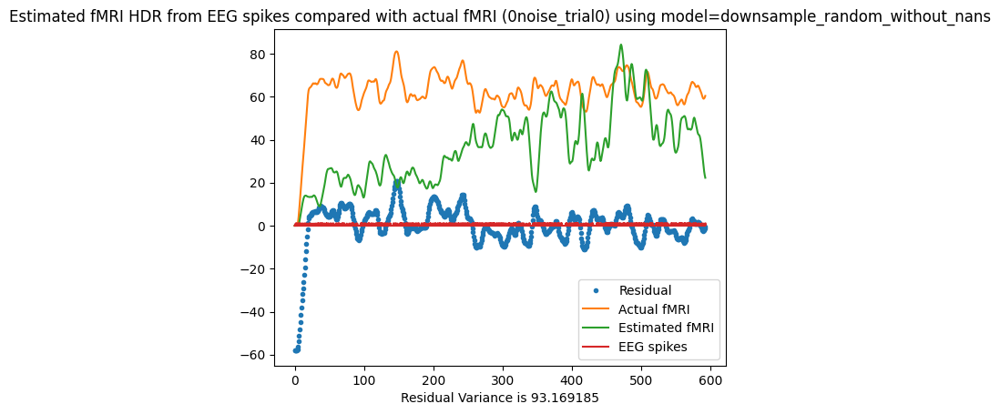

Residual Variance is 93.169185


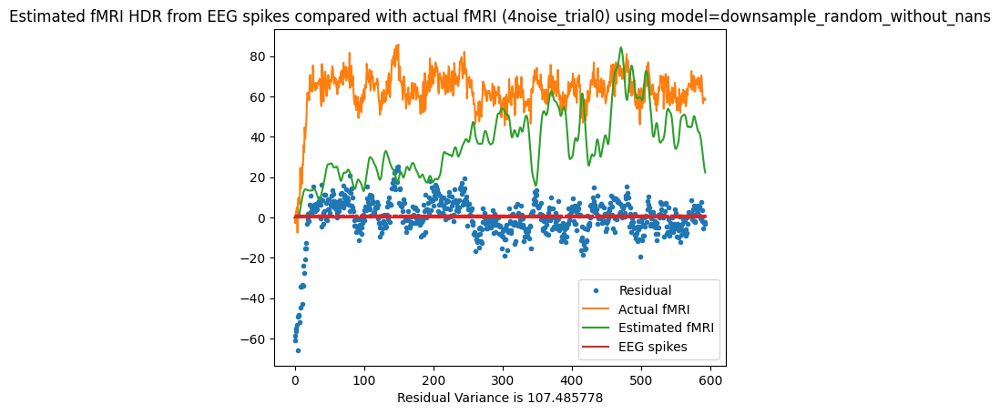

Residual Variance is 107.485778


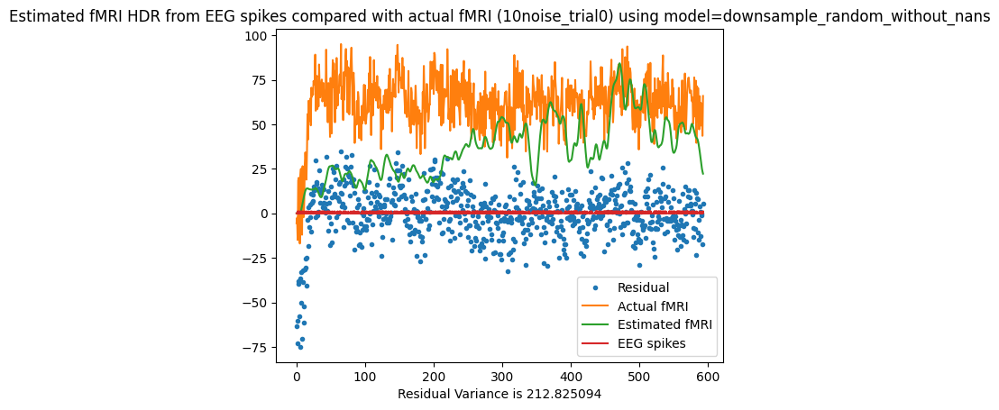

Residual Variance is 212.825094


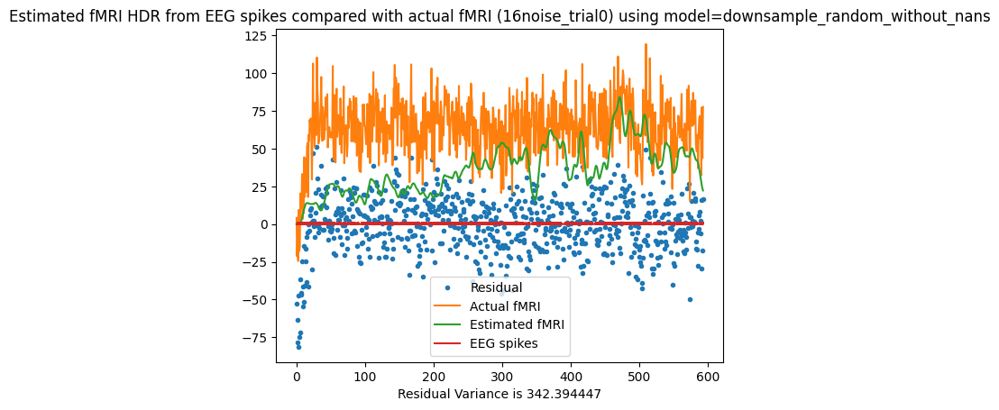

Residual Variance is 342.394447
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.42 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.50 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 3.62 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.80 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.73 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 3.94 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 3.96 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 3.96 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 3.88 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 3.97 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 3.88 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 3.89 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 3.85 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 3.87 seconds
De

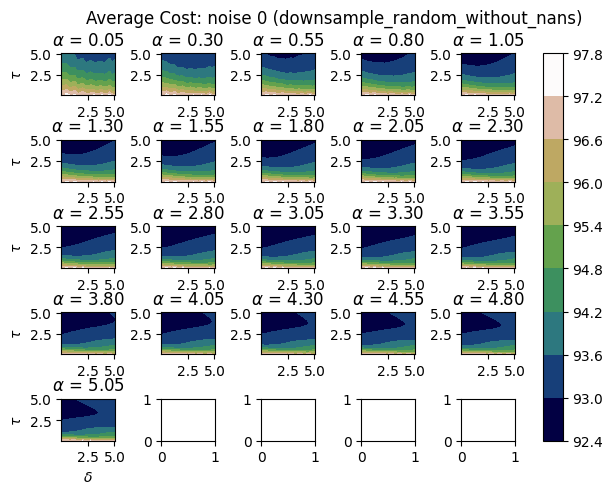

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 93.71801971625982; at
     delta   tau  alpha
427   0.05  5.05    1.8


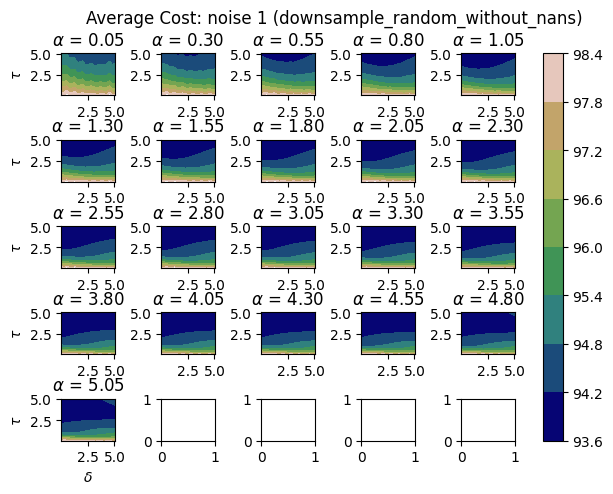

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 109.04860625578696; at
     delta   tau  alpha
427   0.05  5.05    1.8


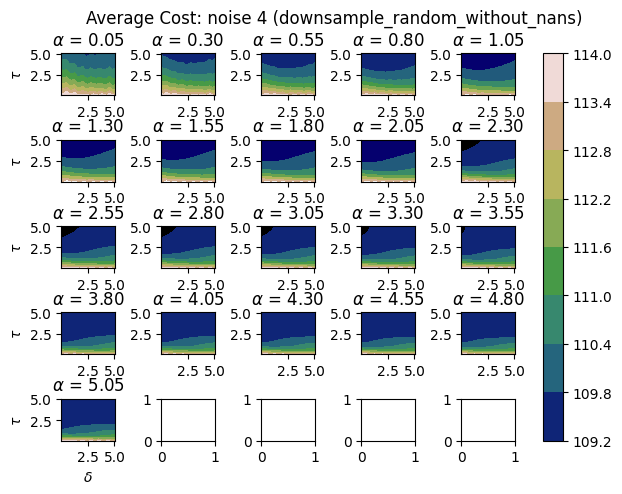

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 141.92530799833884; at
     delta   tau  alpha
426   0.05  5.05   1.55


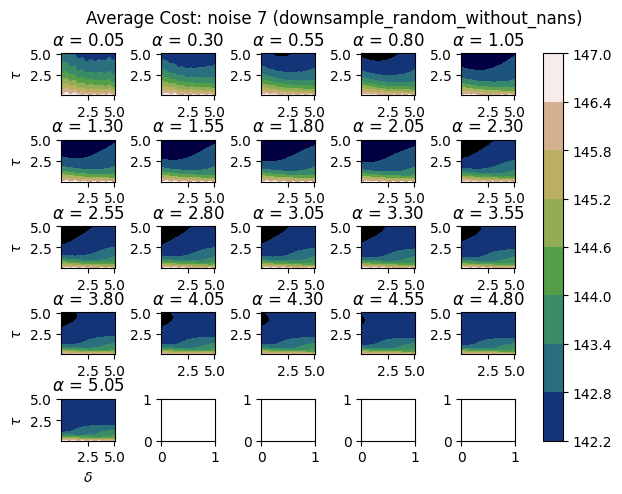

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 191.60303422154; at
     delta   tau  alpha
426   0.05  5.05   1.55


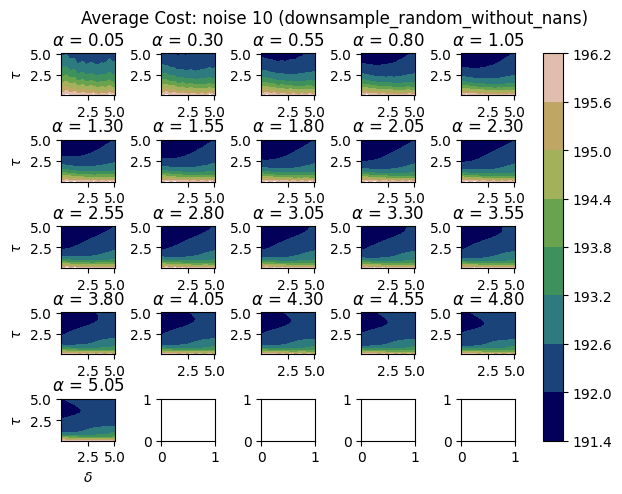

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 263.12927651949923; at
     delta   tau  alpha
425   0.05  5.05    1.3


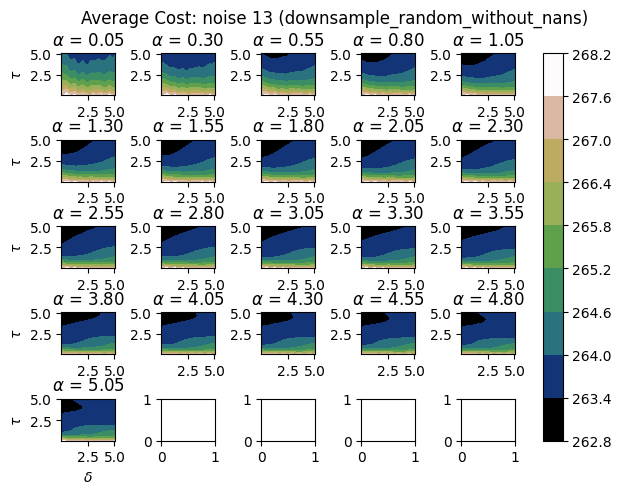

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 348.8307005044082; at
     delta   tau  alpha
429   0.05  5.05    2.3


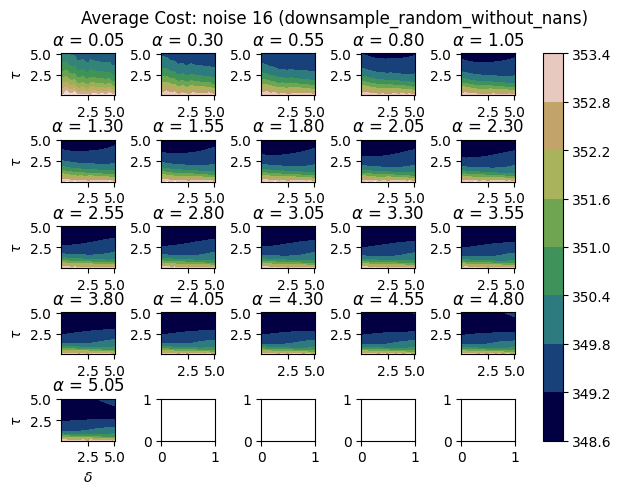

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


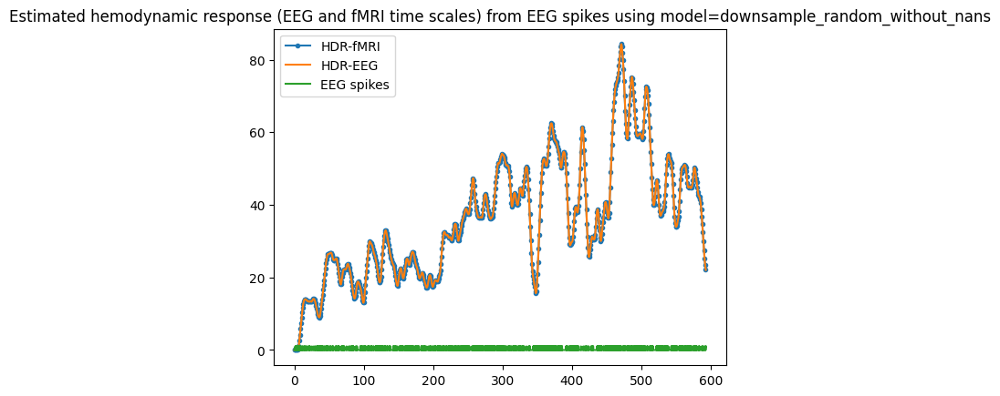

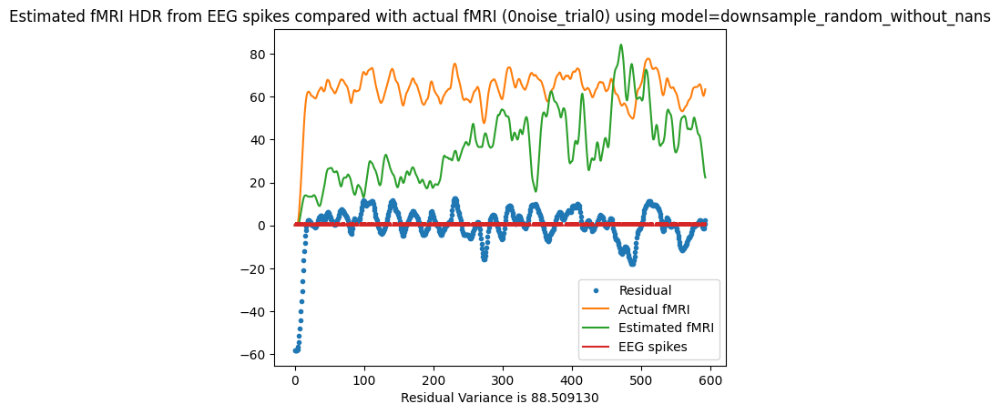

Residual Variance is 88.509130


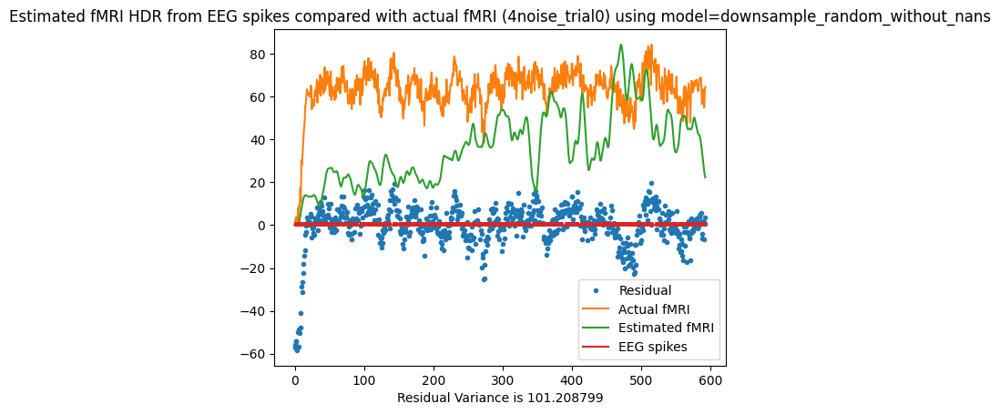

Residual Variance is 101.208799


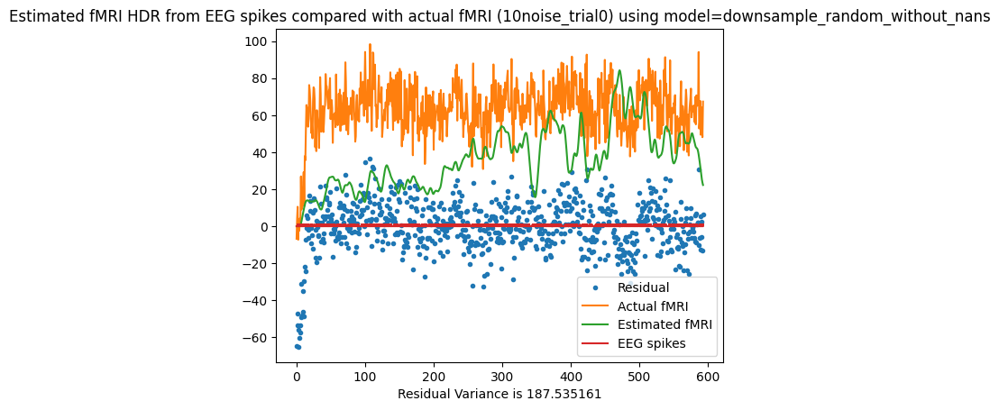

Residual Variance is 187.535161


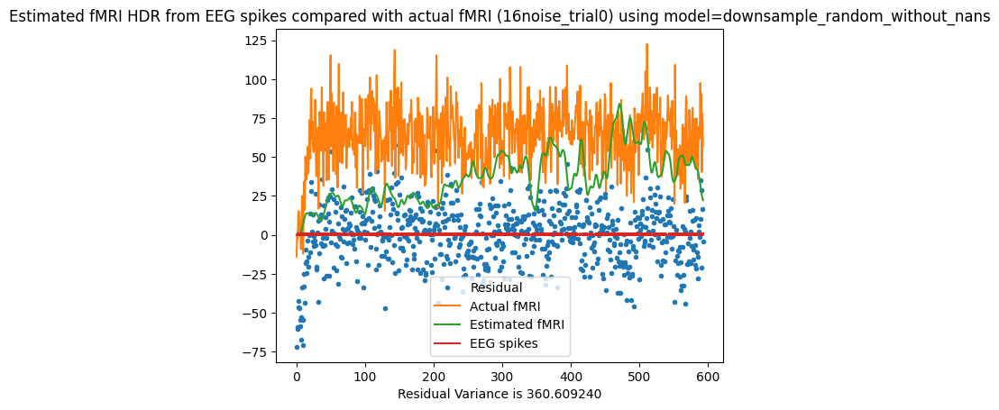

Residual Variance is 360.609240
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.54 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.74 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 4.04 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 4.06 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.97 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 4.08 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 4.08 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 4.11 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 4.13 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 4.32 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 4.06 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 4.11 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 4.10 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 4.00 seconds
De

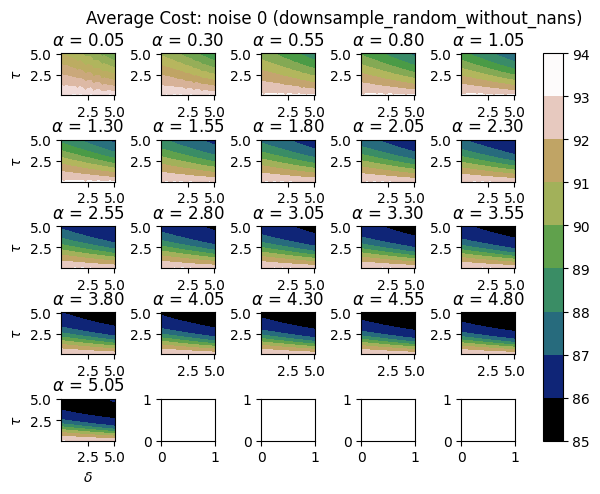

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 86.76966828578473; at
      delta   tau  alpha
7050    3.8  5.05    3.8


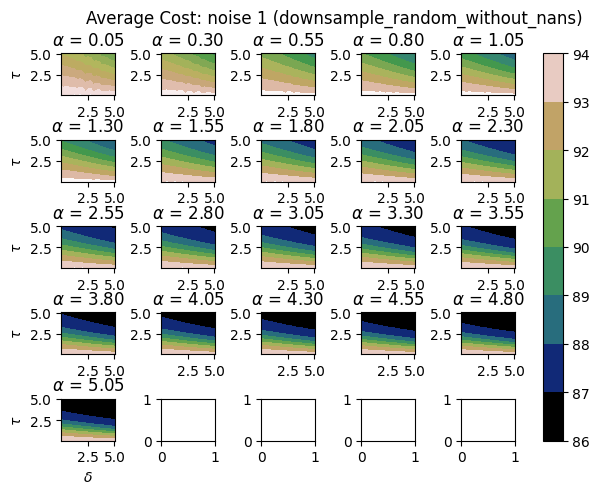

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 102.05690515491396; at
      delta   tau  alpha
5728   3.05  5.05   4.05


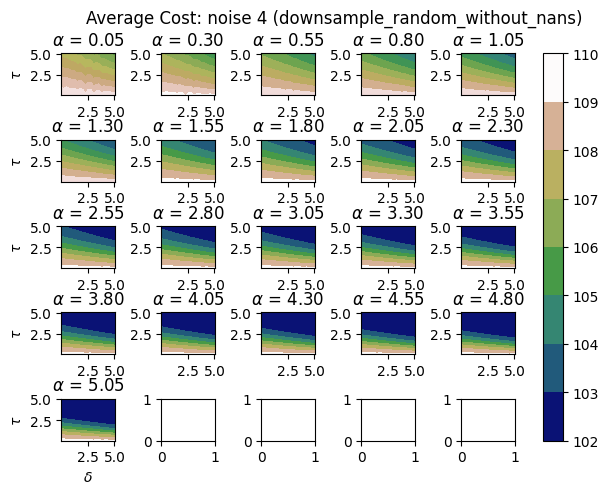

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 134.83497246246884; at
      delta   tau  alpha
5287    2.8  5.05   4.05


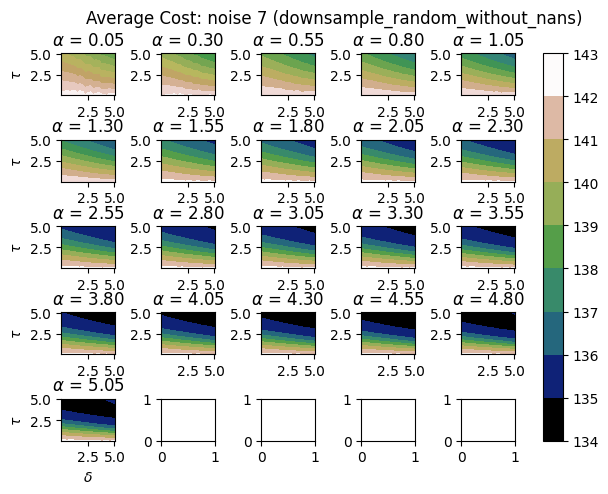

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 185.18345311618472; at
      delta   tau  alpha
6609   3.55  5.05    3.8


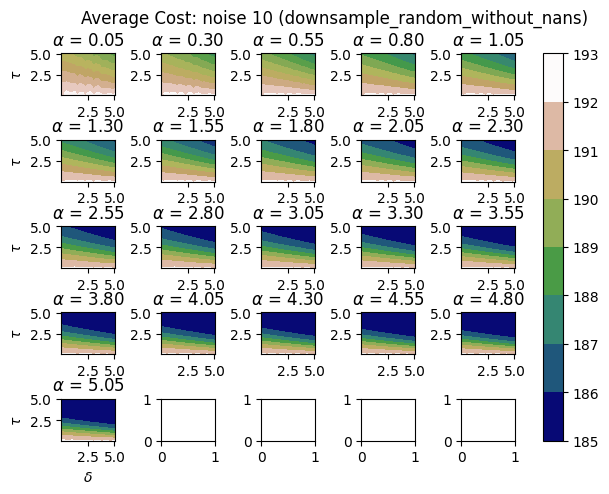

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 254.32961026702208; at
      delta   tau  alpha
5728   3.05  5.05   4.05


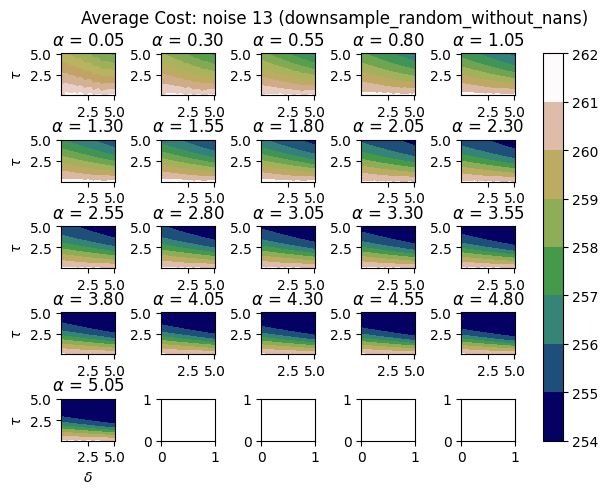

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 341.85746379982766; at
      delta   tau  alpha
8372   4.55  5.05   3.55


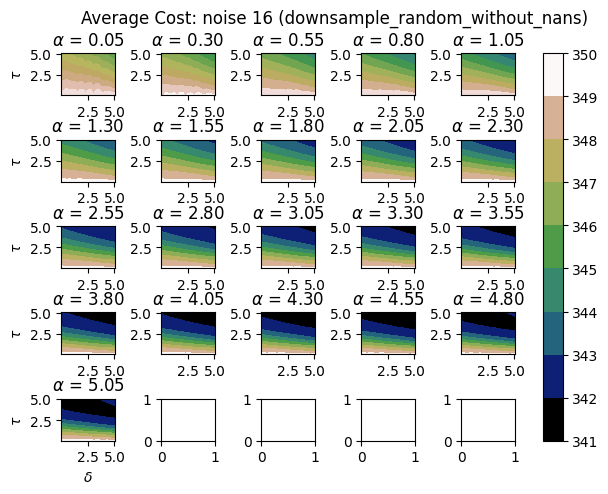

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


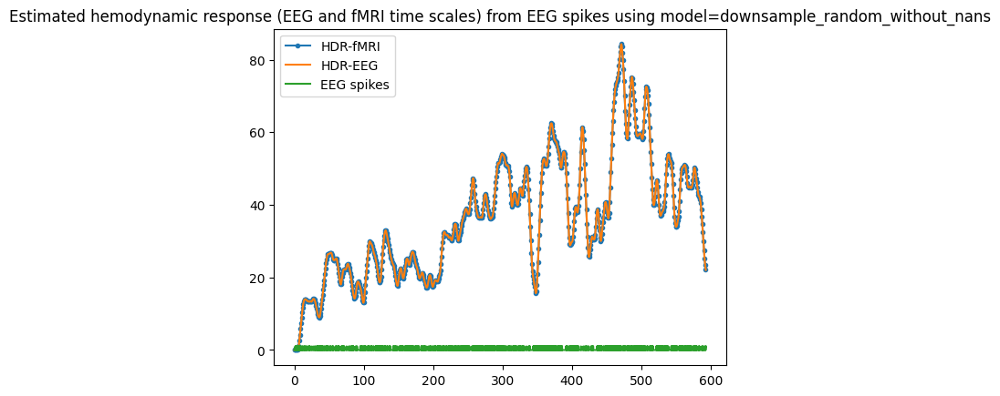

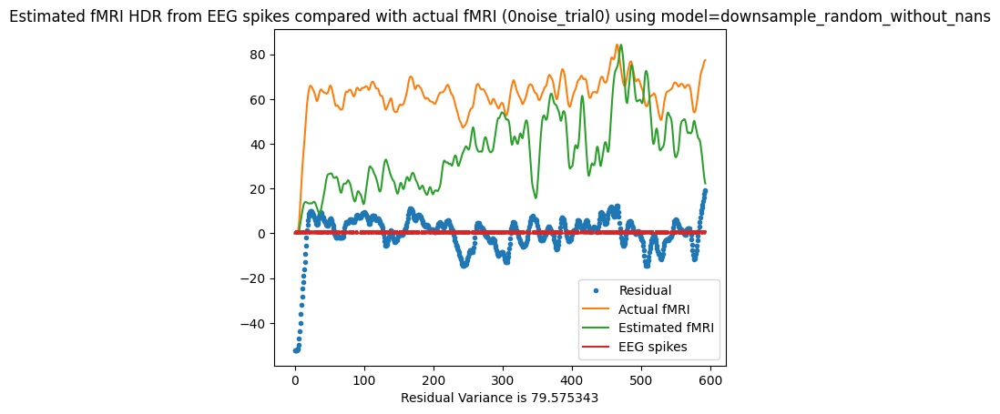

Residual Variance is 79.575343


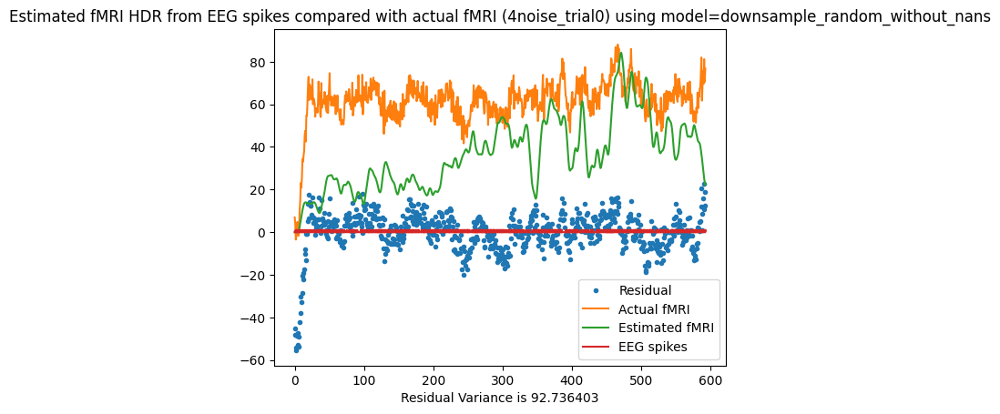

Residual Variance is 92.736403


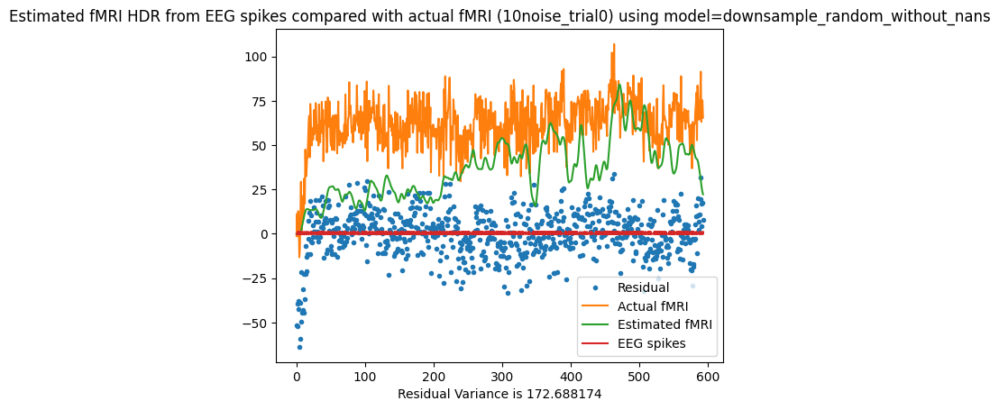

Residual Variance is 172.688174


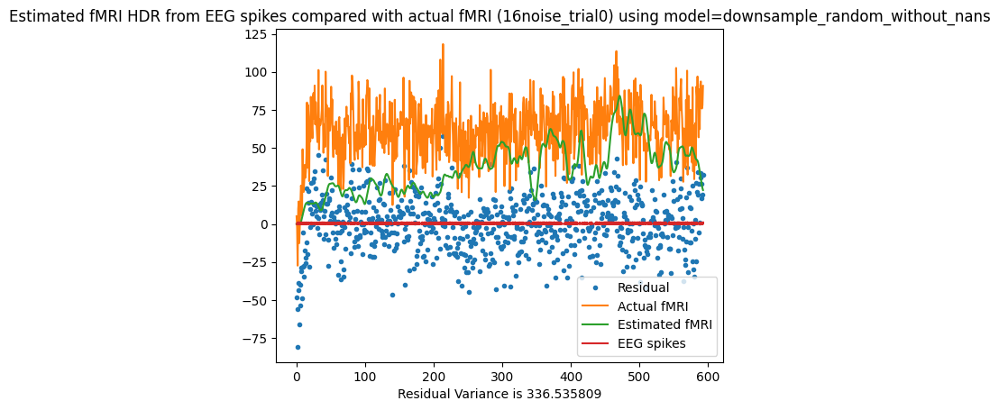

Residual Variance is 336.535809
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.71 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.95 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 4.31 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.87 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 4.55 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 4.15 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 3.90 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 3.89 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 3.90 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 4.52 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 4.23 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 4.11 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 3.95 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 4.37 seconds
De

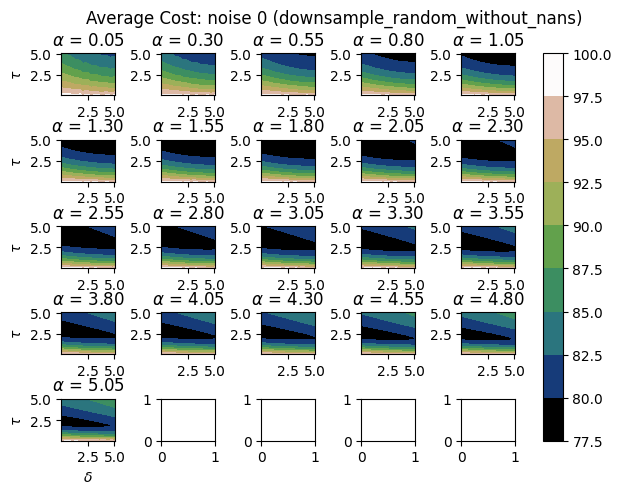

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 79.67676147247099; at
     delta  tau  alpha
325   0.05  3.8   2.55


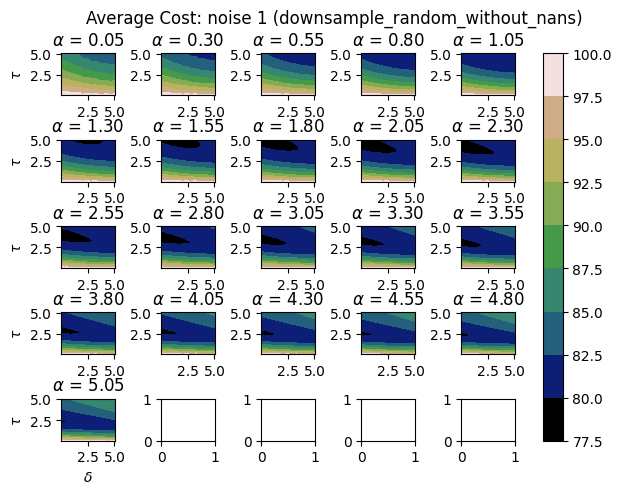

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 95.24826150566022; at
     delta  tau  alpha
325   0.05  3.8   2.55


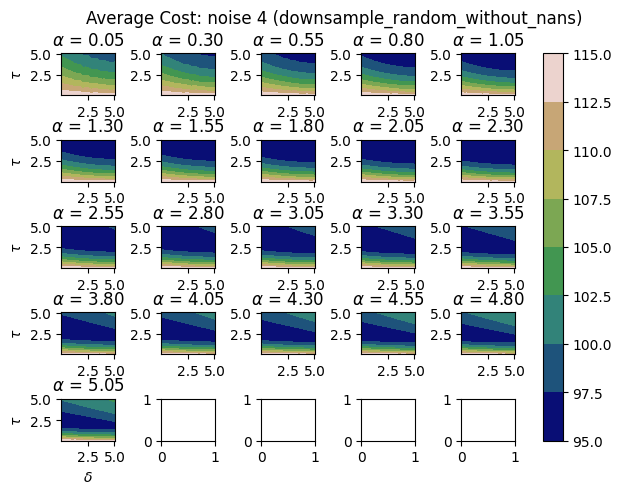

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 127.96672172094708; at
     delta  tau  alpha
366   0.05  4.3    2.3


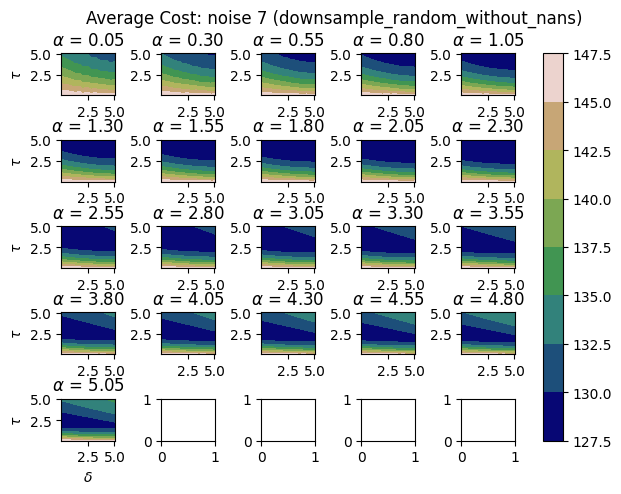

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 179.10129943629727; at
     delta   tau  alpha
305   0.05  3.55    2.8


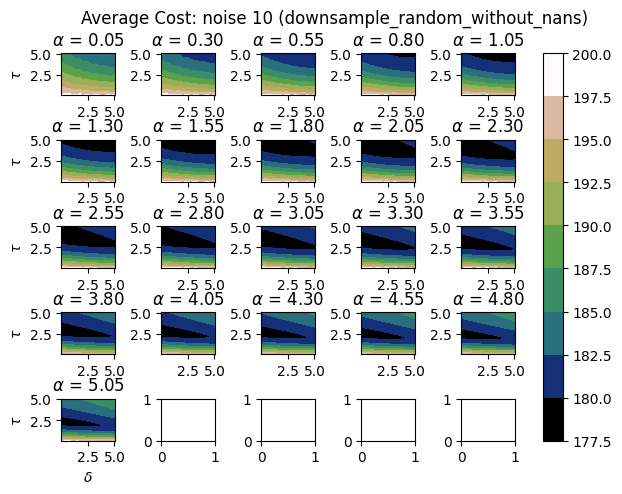

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 248.16708891878883; at
     delta  tau  alpha
286   0.05  3.3    3.3


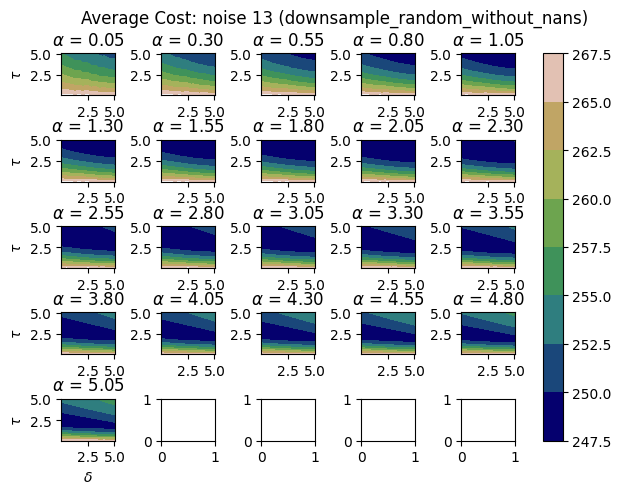

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 334.9512670813271; at
     delta  tau  alpha
286   0.05  3.3    3.3


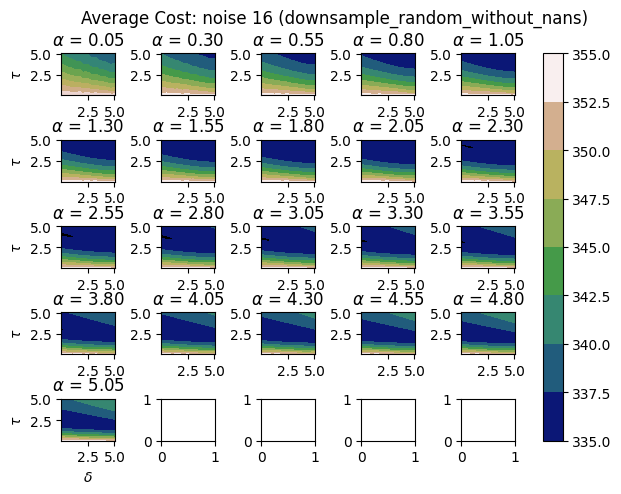

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


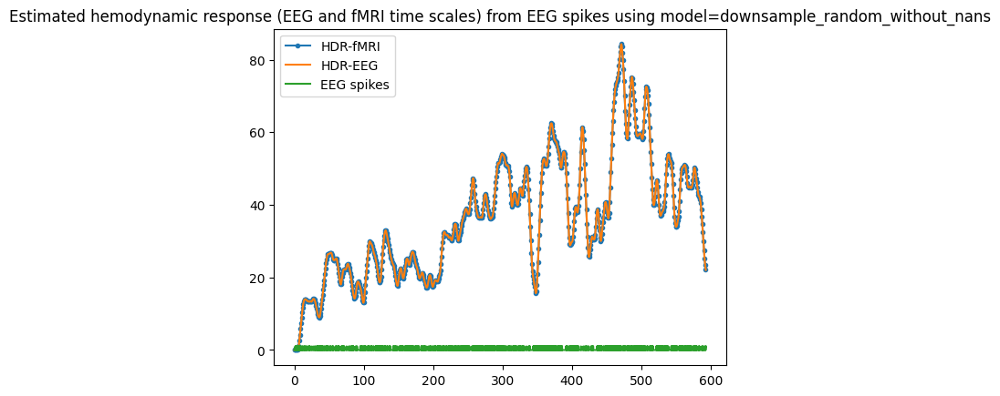

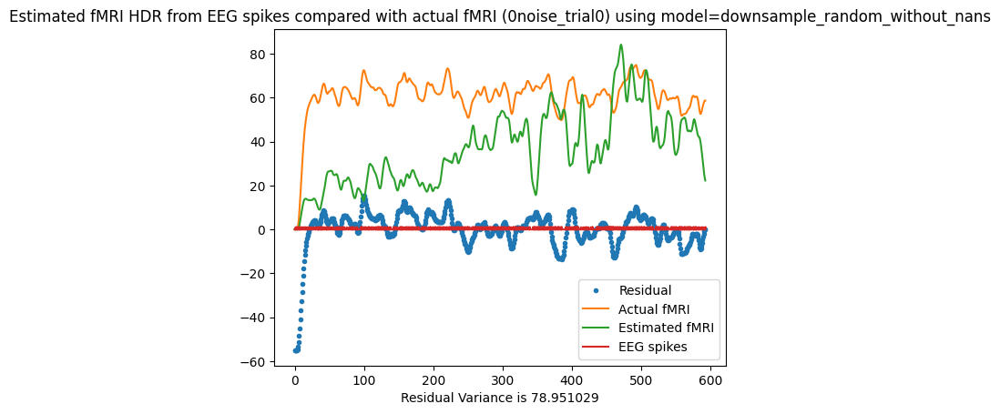

Residual Variance is 78.951029


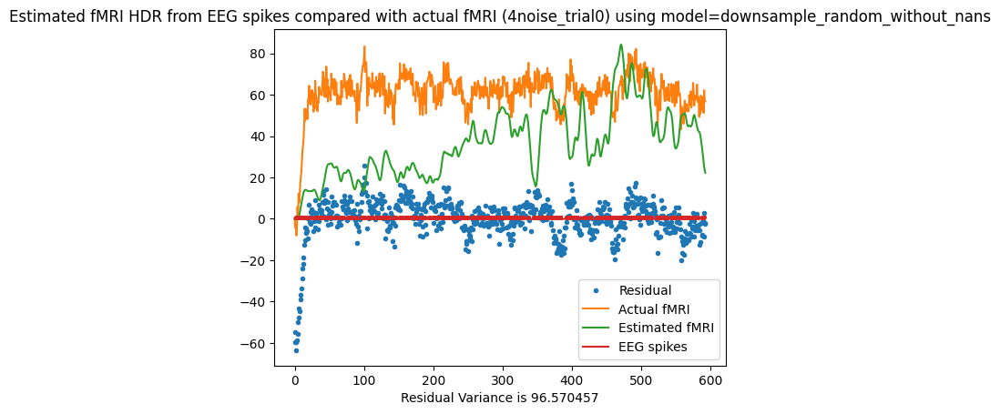

Residual Variance is 96.570457


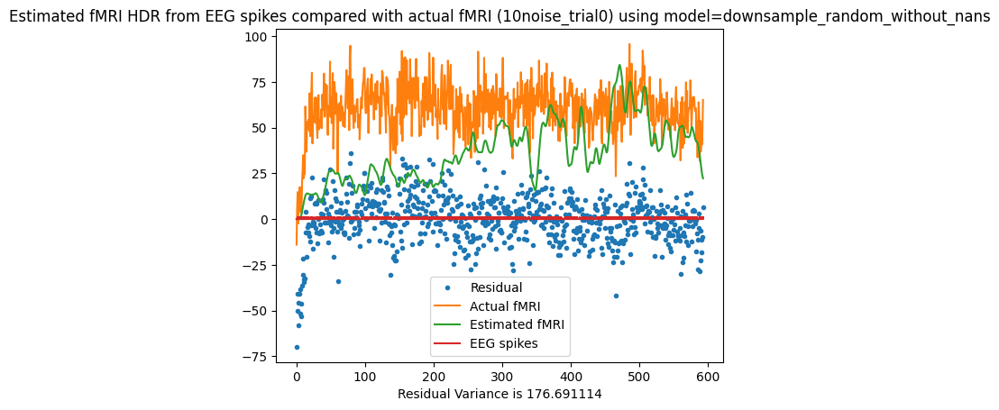

Residual Variance is 176.691114


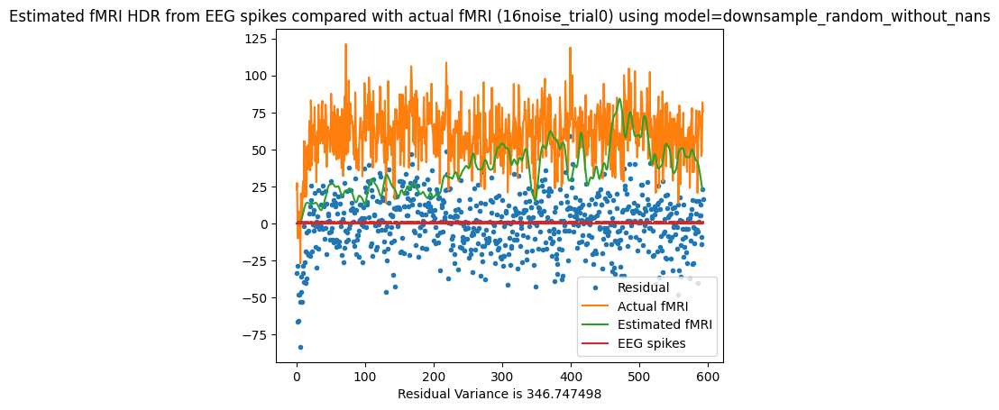

Residual Variance is 346.747498
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.51 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.72 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 4.52 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 4.01 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.83 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 3.92 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 4.15 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 4.15 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 4.14 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 4.13 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 4.16 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 4.07 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 4.16 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 4.14 seconds
De

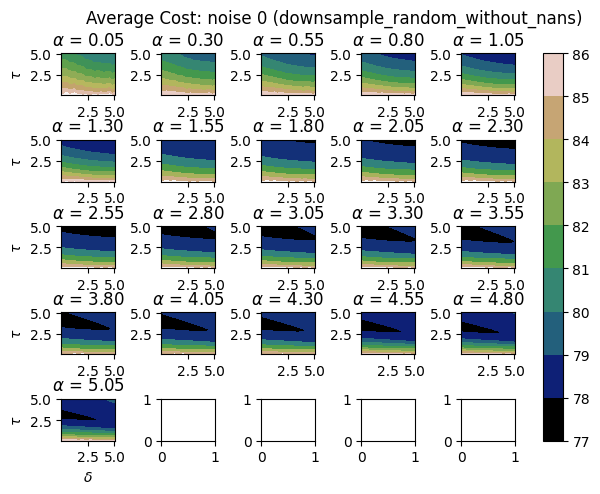

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 78.8760874671462; at
     delta   tau  alpha
431   0.05  5.05    2.8


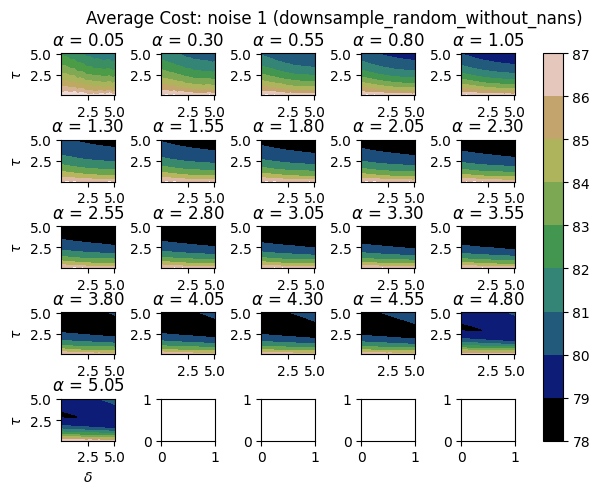

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 94.06753945618573; at
     delta   tau  alpha
431   0.05  5.05    2.8


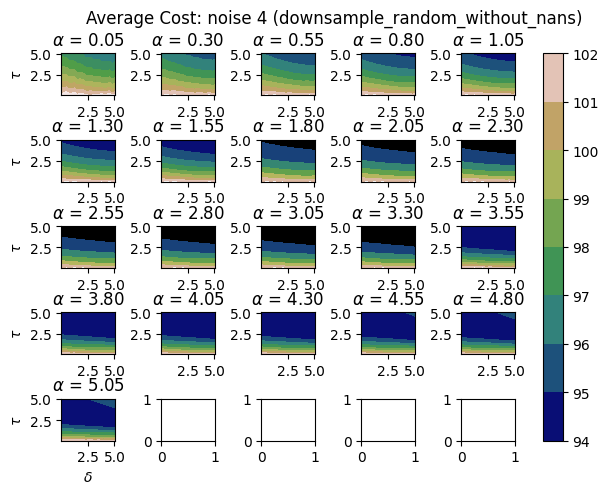

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 127.35764119045456; at
     delta   tau  alpha
431   0.05  5.05    2.8


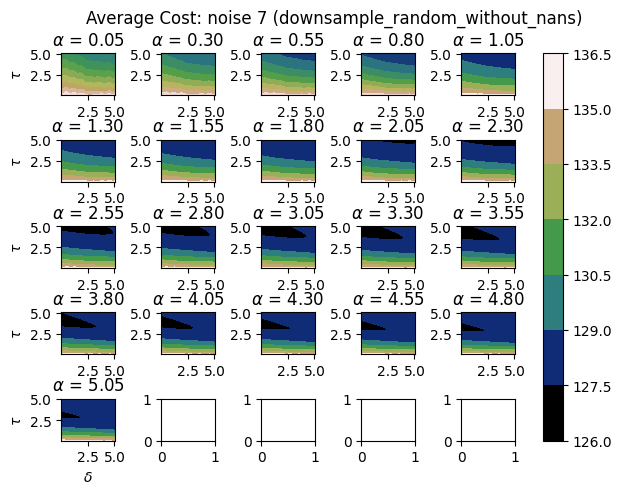

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 176.03973402497726; at
     delta   tau  alpha
872    0.3  5.05    2.8


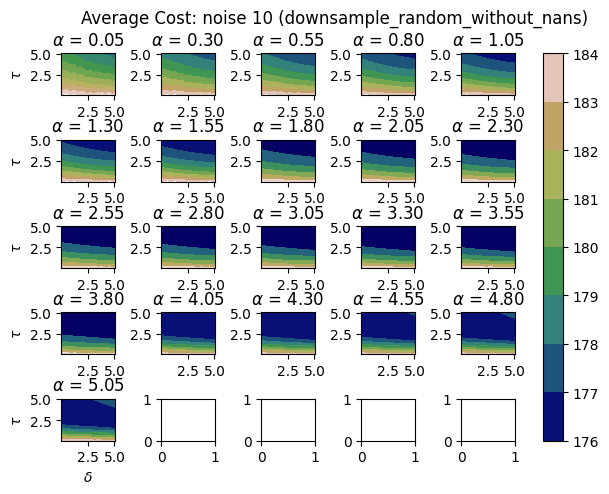

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 247.73858922679239; at
     delta  tau  alpha
411   0.05  4.8   3.05


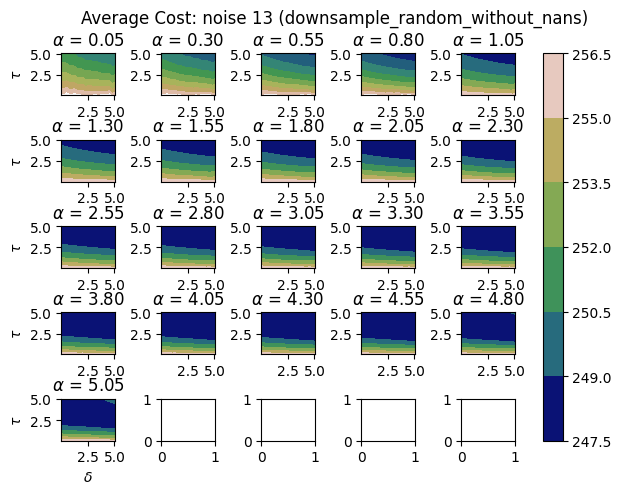

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 333.00446040831844; at
     delta   tau  alpha
431   0.05  5.05    2.8


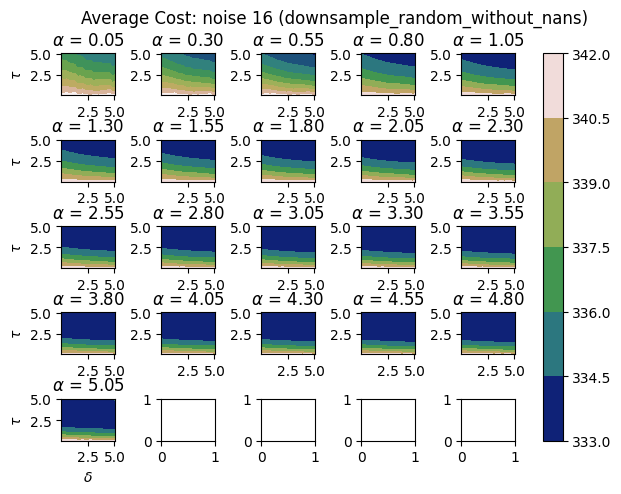

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


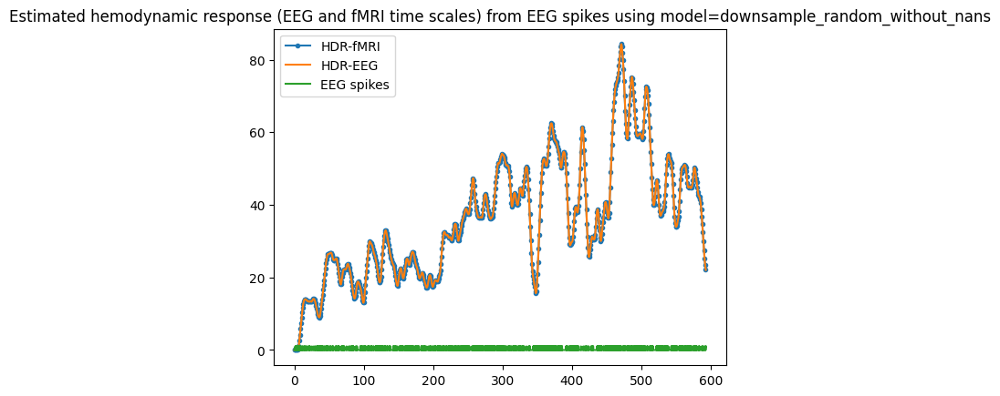

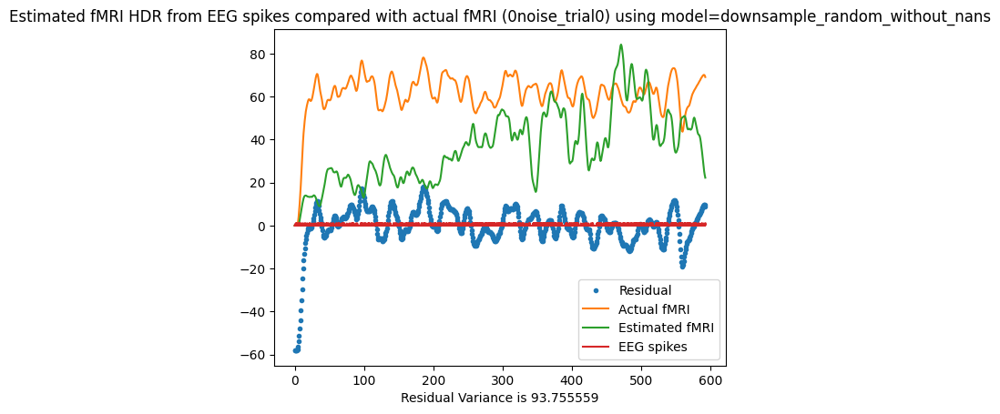

Residual Variance is 93.755559


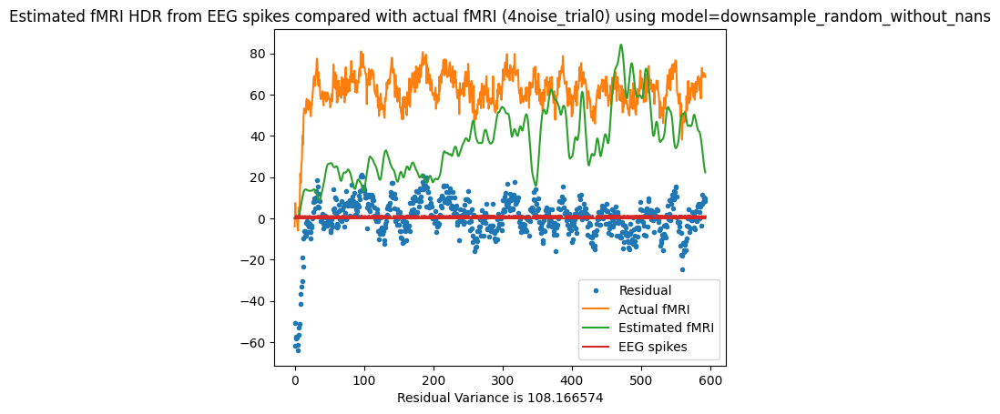

Residual Variance is 108.166574


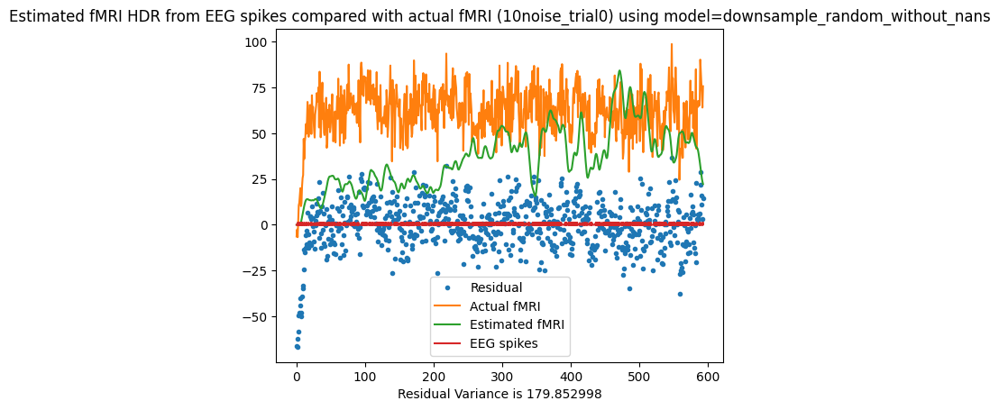

Residual Variance is 179.852998


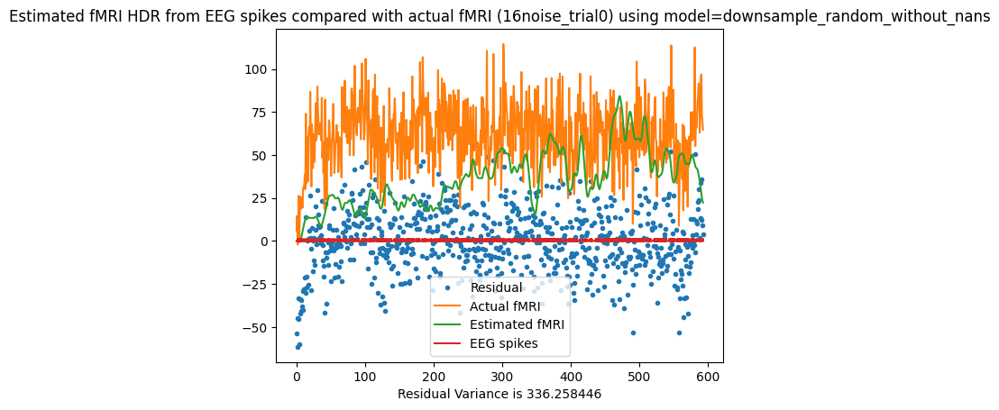

Residual Variance is 336.258446
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.70 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 4.02 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 4.07 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.86 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.91 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 4.03 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 4.29 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 4.14 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 3.82 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 3.99 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 3.90 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 4.02 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 3.76 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 3.81 seconds
De

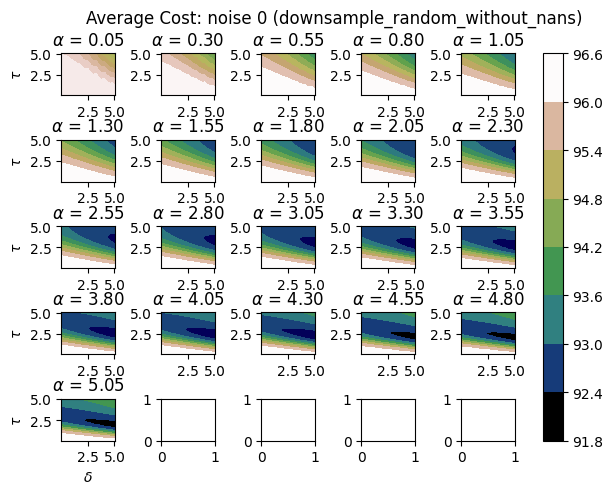

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 93.11007553007201; at
      delta   tau  alpha
9008   5.05  2.05   5.05


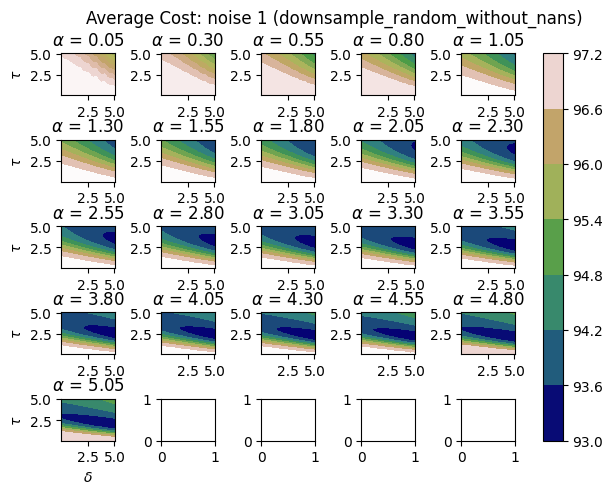

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 108.46818660947226; at
      delta   tau  alpha
9008   5.05  2.05   5.05


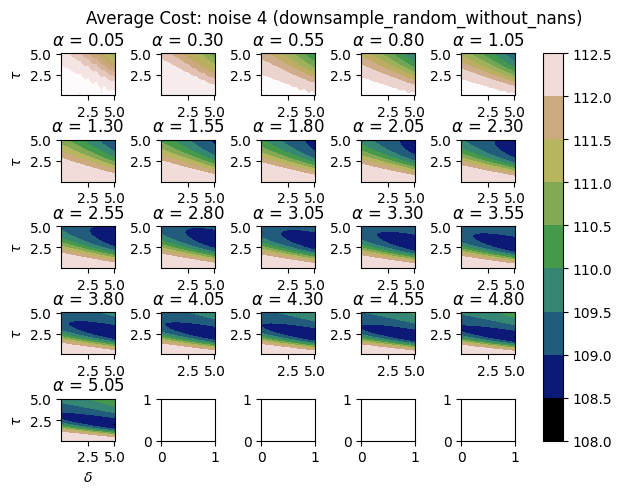

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 140.97138940484393; at
      delta   tau  alpha
9008   5.05  2.05   5.05


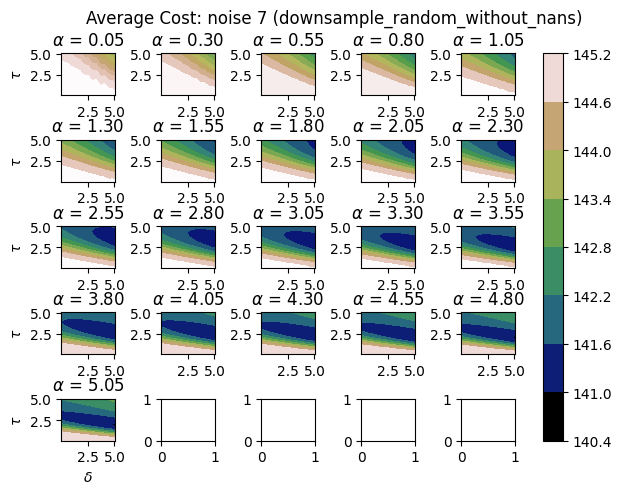

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 191.51589067112846; at
      delta   tau  alpha
9008   5.05  2.05   5.05


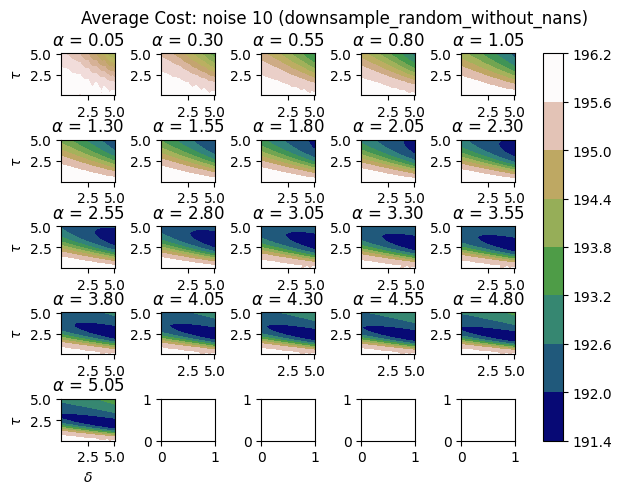

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 260.57433062339226; at
      delta   tau  alpha
9008   5.05  2.05   5.05


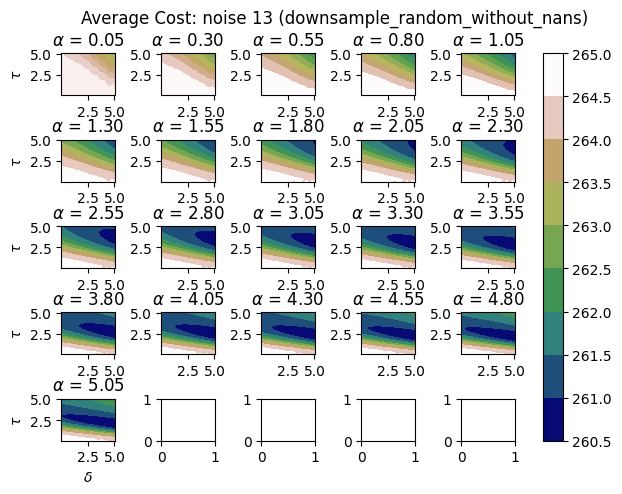

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 349.23092709658124; at
      delta   tau  alpha
9008   5.05  2.05   5.05


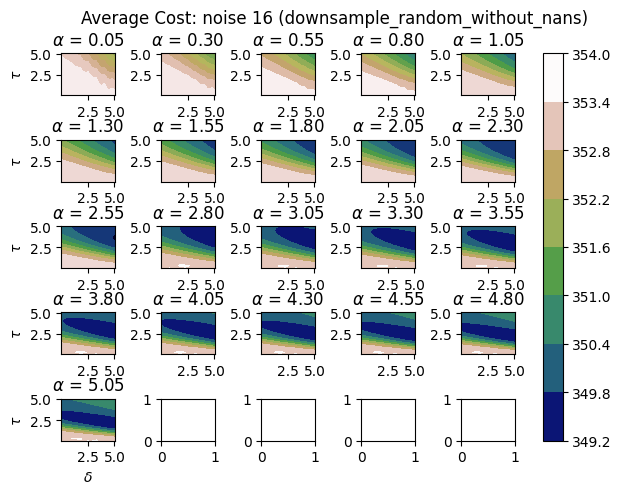

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


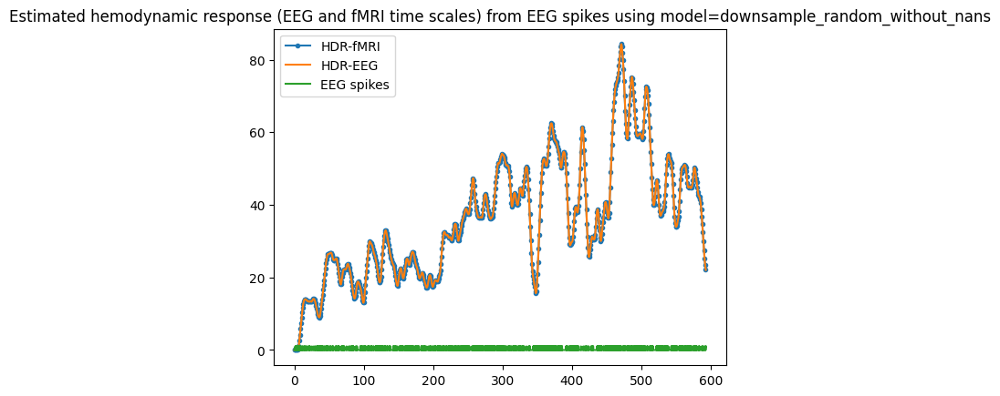

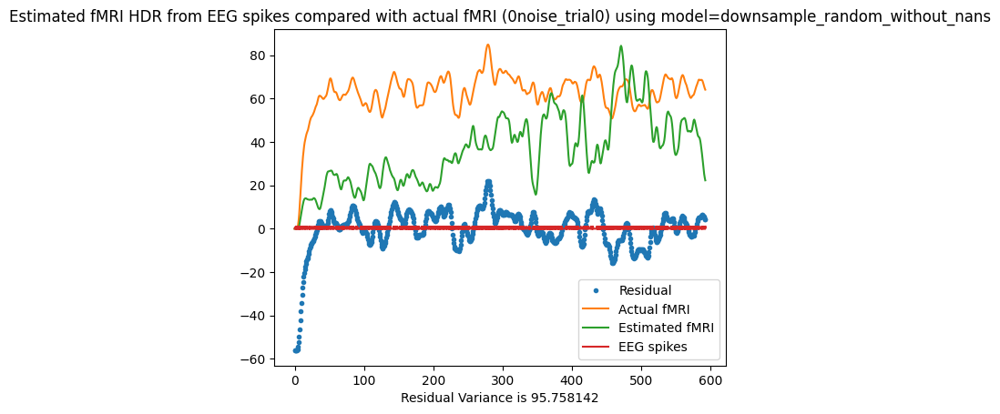

Residual Variance is 95.758142


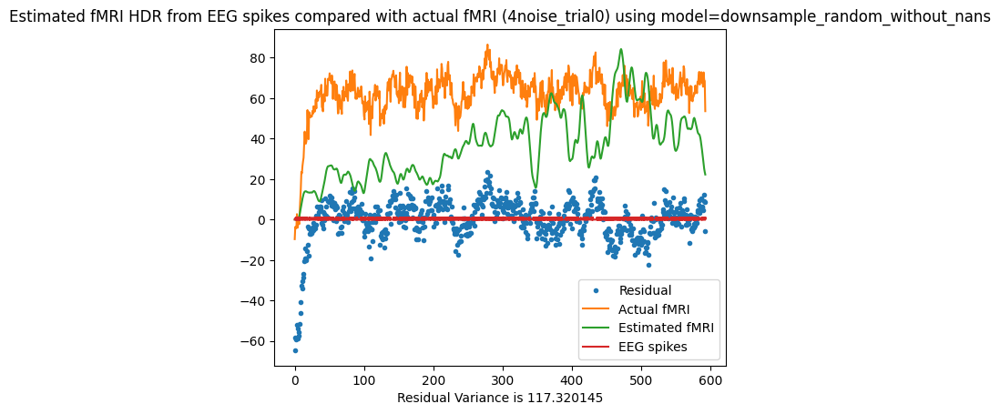

Residual Variance is 117.320145


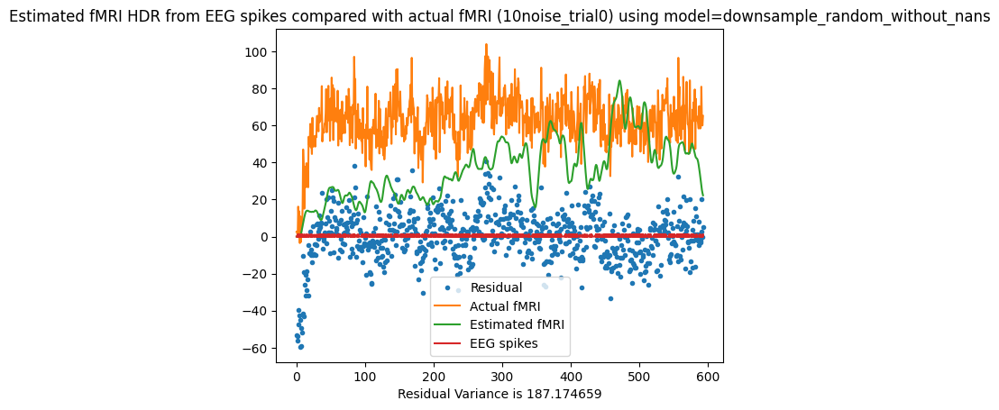

Residual Variance is 187.174659


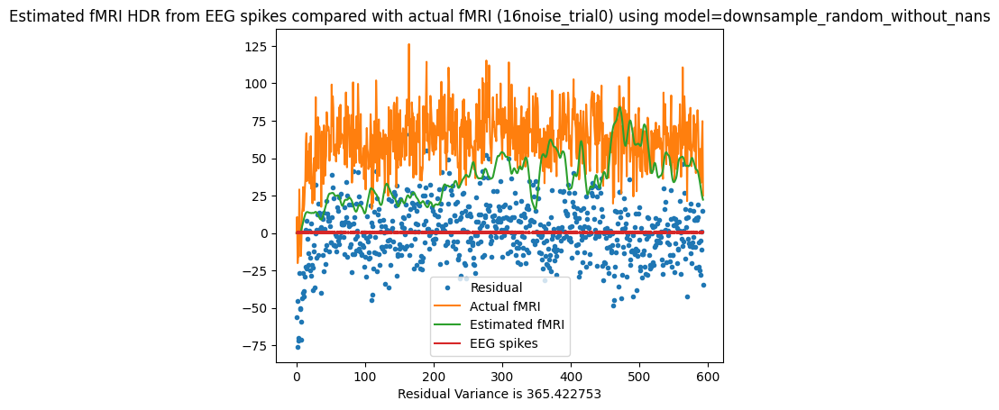

Residual Variance is 365.422753
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.87 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.70 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 3.87 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.92 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.85 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 4.03 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 3.87 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 3.98 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 4.03 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 3.90 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 3.75 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 4.09 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 4.34 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 4.04 seconds
De

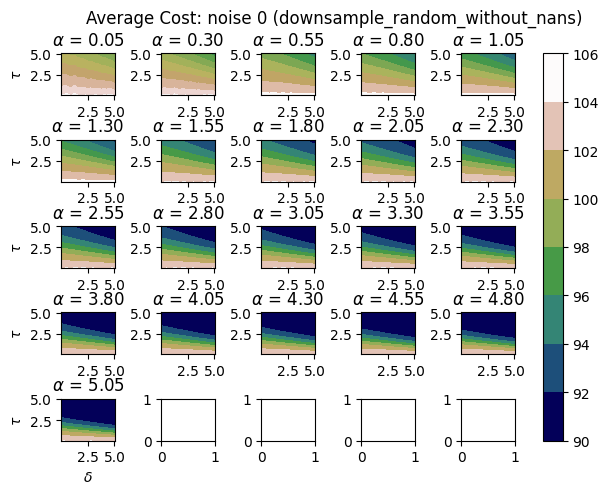

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 91.6795821762983; at
      delta   tau  alpha
9130   5.05  3.55   4.05


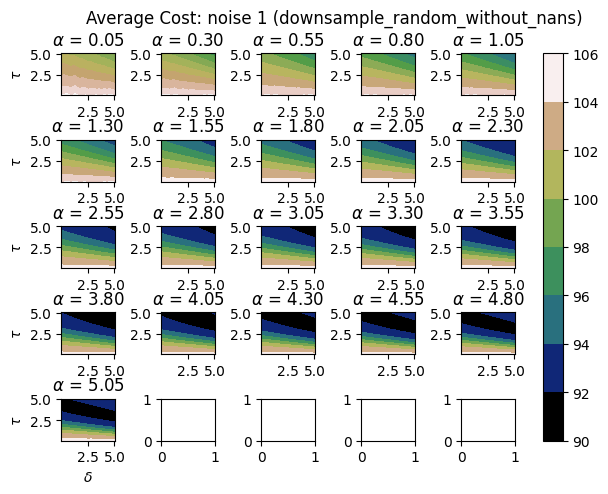

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 106.86299172312366; at
      delta   tau  alpha
9130   5.05  3.55   4.05


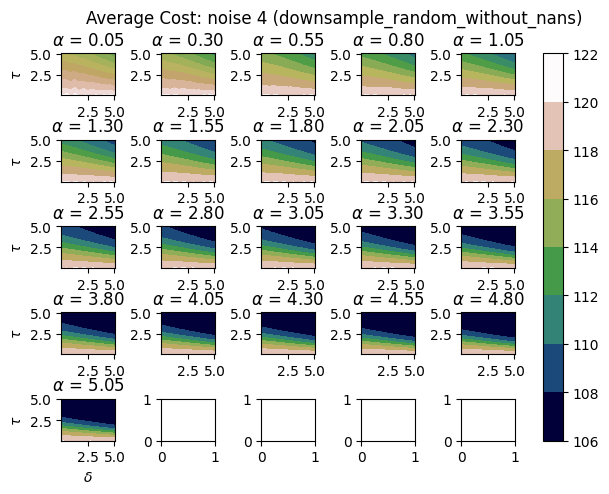

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 139.4392361833815; at
      delta  tau  alpha
9110   5.05  3.3    4.3


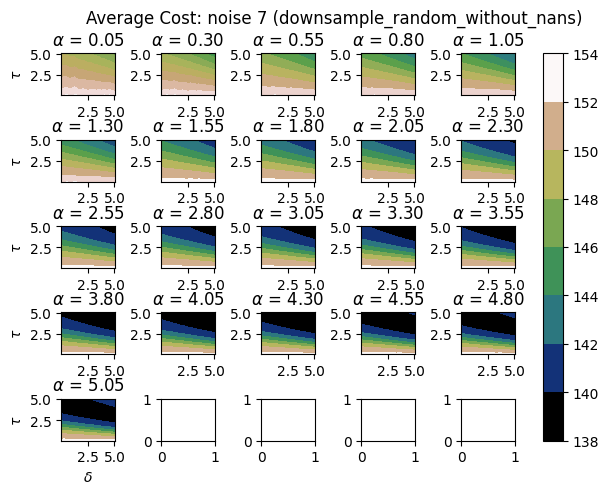

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 190.93524102901557; at
      delta  tau  alpha
9110   5.05  3.3    4.3


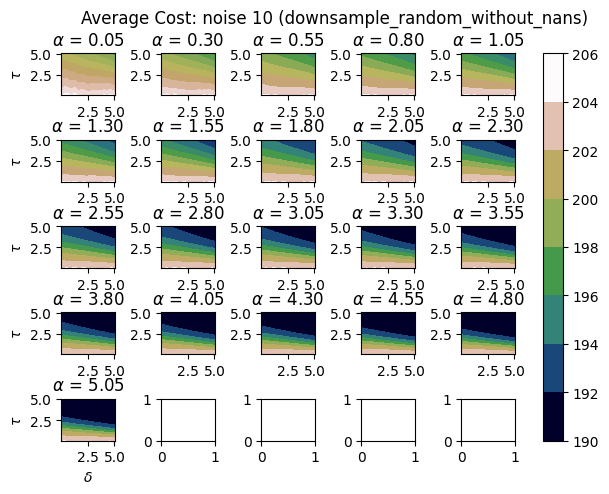

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 260.5541395129366; at
      delta   tau  alpha
9130   5.05  3.55   4.05


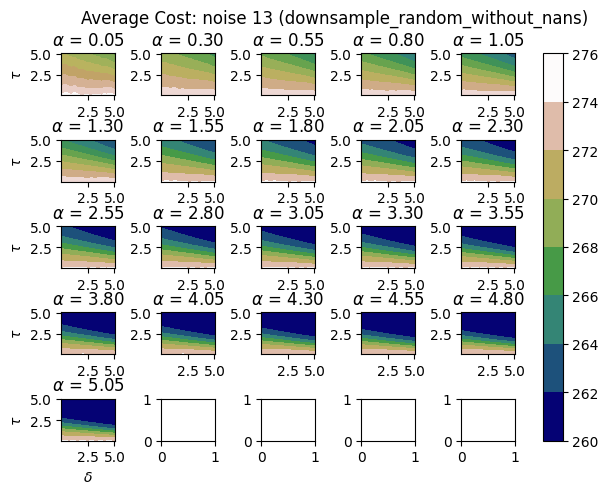

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 345.7609627754718; at
      delta  tau  alpha
8670    4.8  3.3   4.55


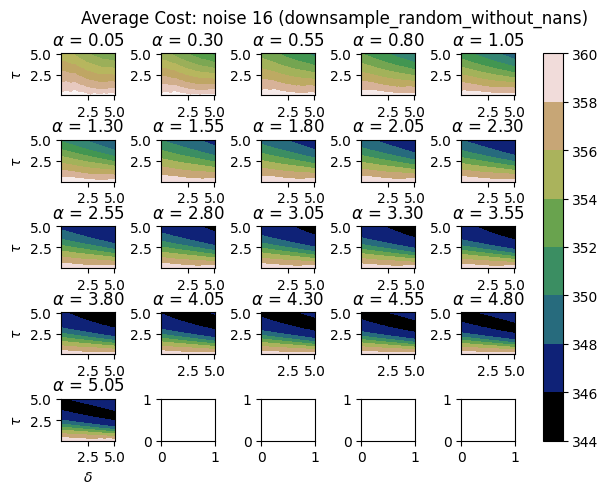

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


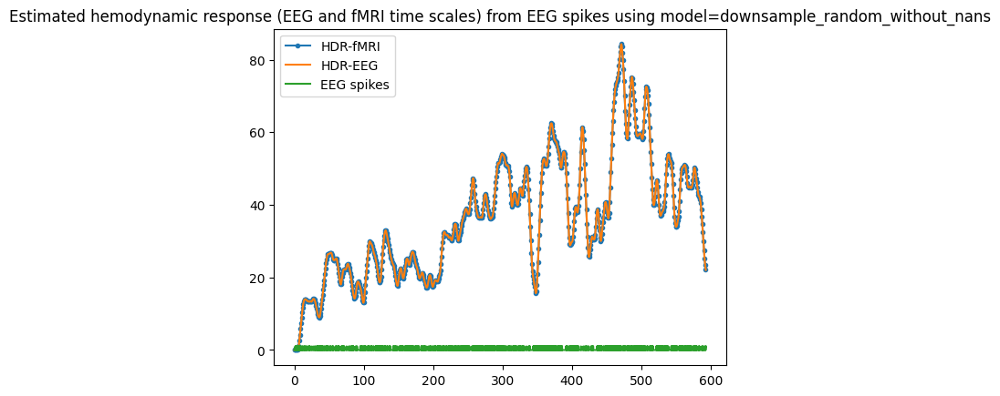

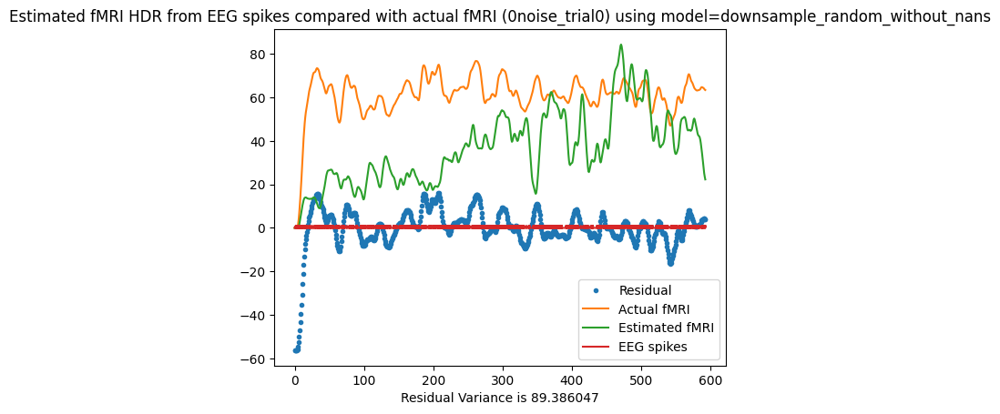

Residual Variance is 89.386047


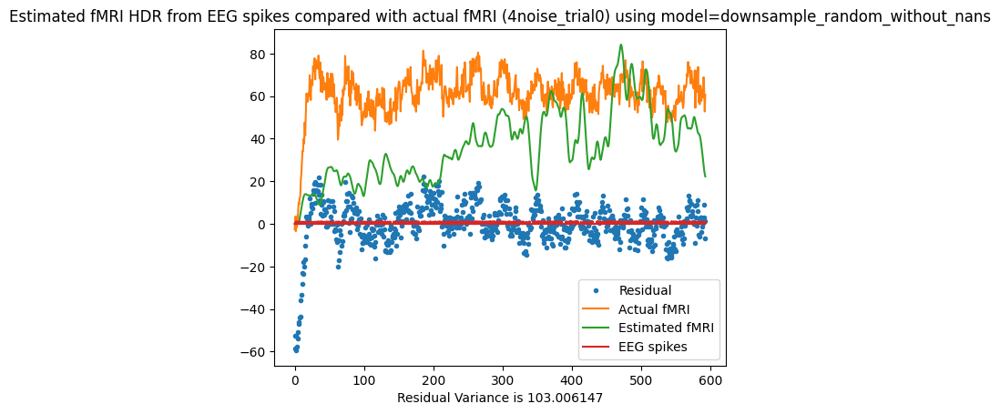

Residual Variance is 103.006147


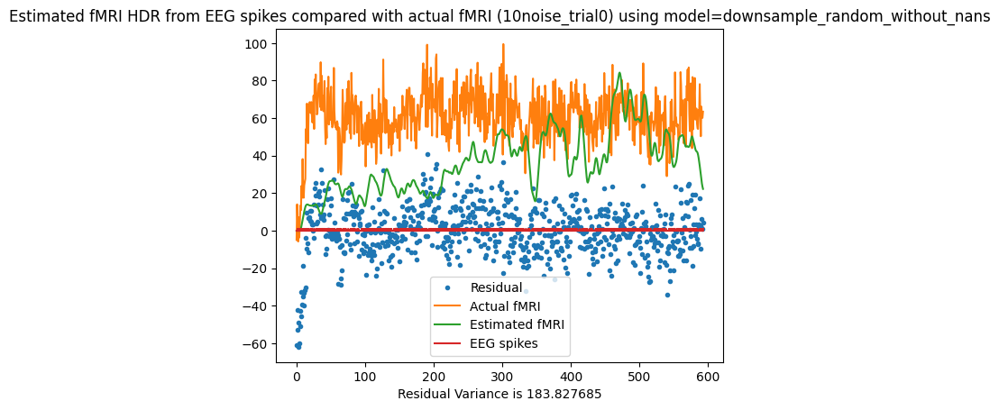

Residual Variance is 183.827685


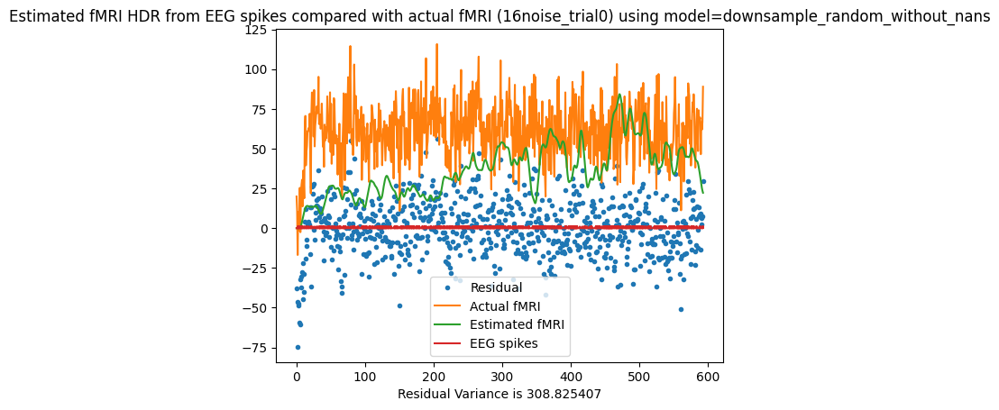

Residual Variance is 308.825407
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.63 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.57 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 3.73 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.77 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 4.02 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 4.23 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 3.98 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 3.88 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 3.80 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 3.86 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 3.76 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 3.76 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 3.77 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 3.94 seconds
De

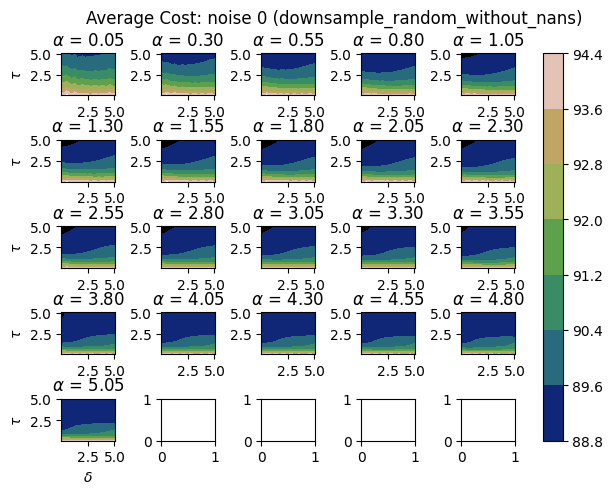

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 89.69381861632057; at
     delta   tau  alpha
426   0.05  5.05   1.55


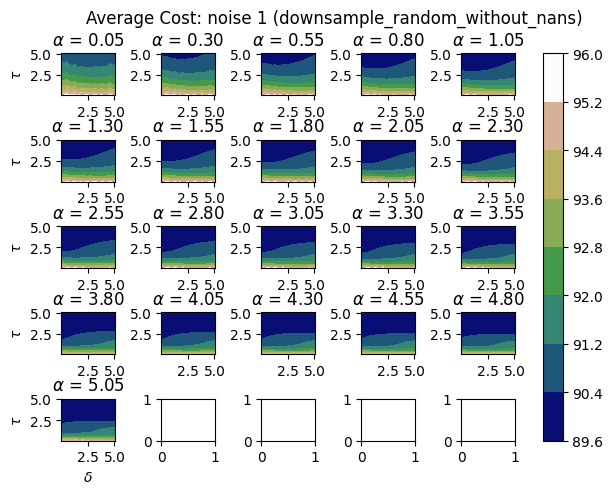

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 104.63973442830387; at
     delta   tau  alpha
426   0.05  5.05   1.55


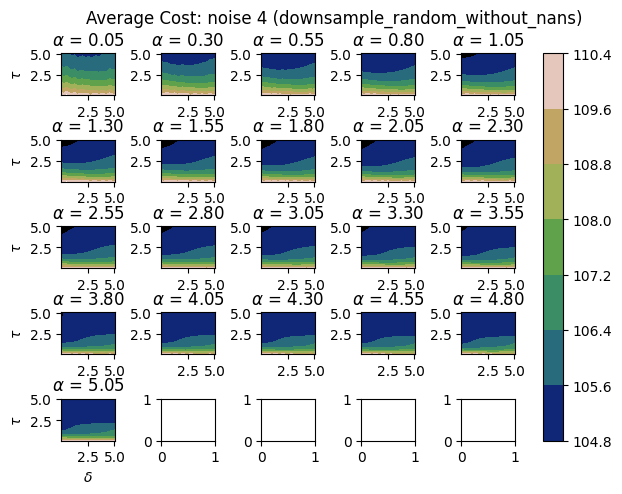

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 136.89998609110714; at
     delta   tau  alpha
425   0.05  5.05    1.3


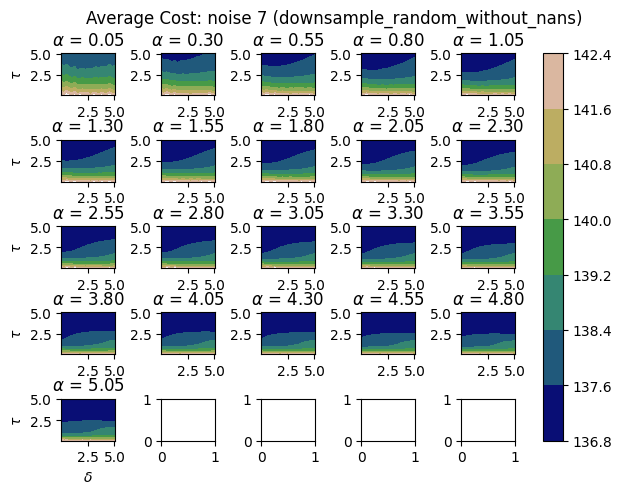

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 187.97800168188897; at
     delta   tau  alpha
426   0.05  5.05   1.55


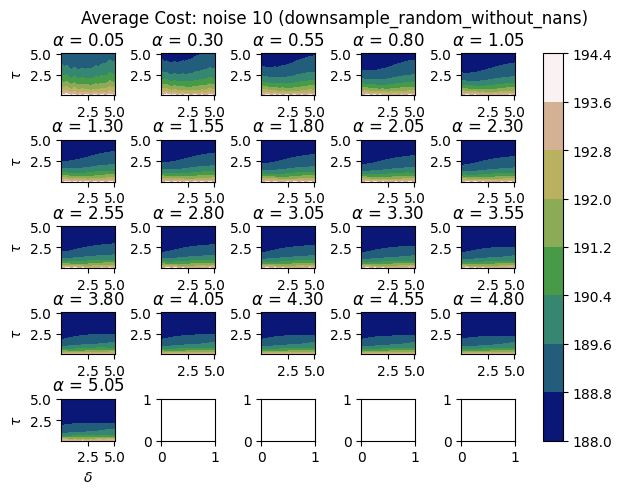

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 258.1790945171217; at
     delta   tau  alpha
425   0.05  5.05    1.3


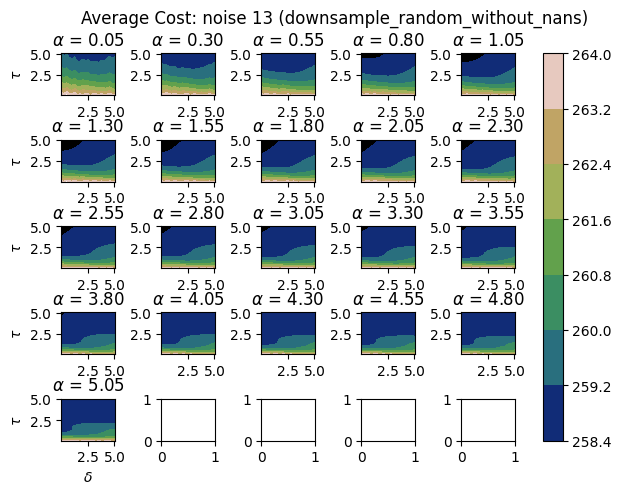

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 344.6747090096693; at
     delta   tau  alpha
429   0.05  5.05    2.3


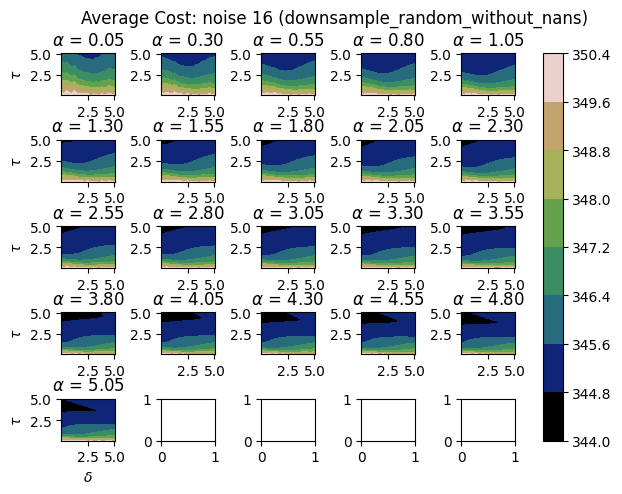

Expected delta: 2.55, Expected tau: 2.55, Expected alpha: 2.55
Scoring downsample_random_without_nans delta=2.55, tau=2.55, alpha=2.55


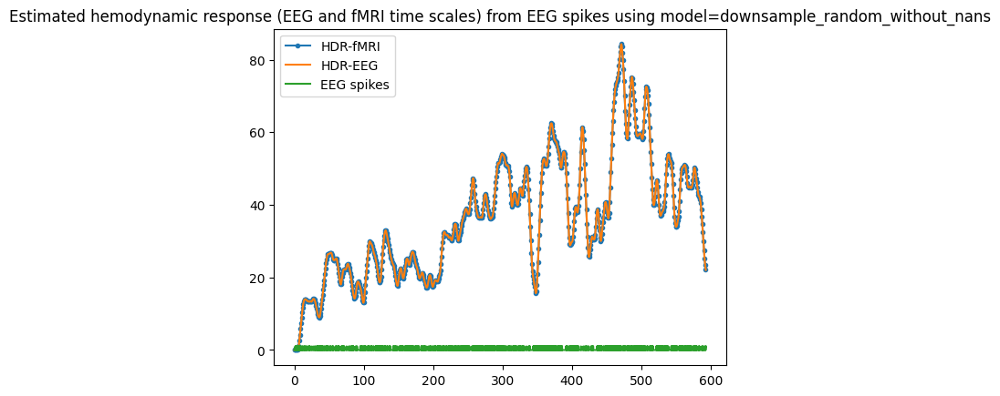

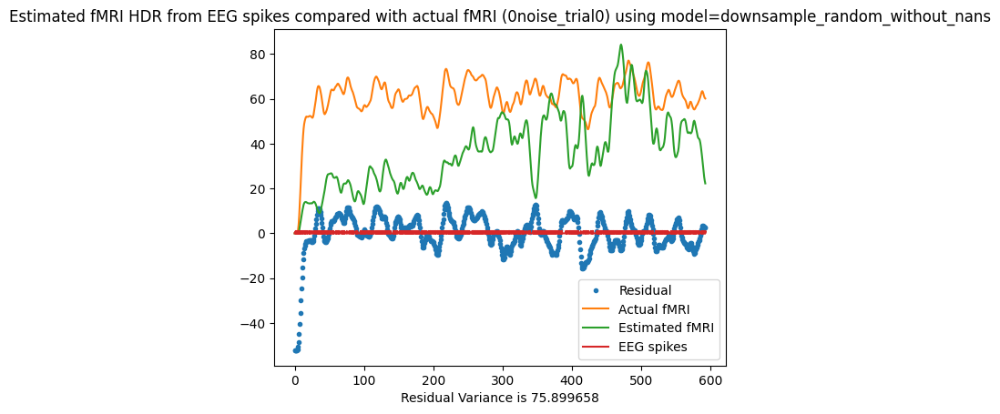

Residual Variance is 75.899658


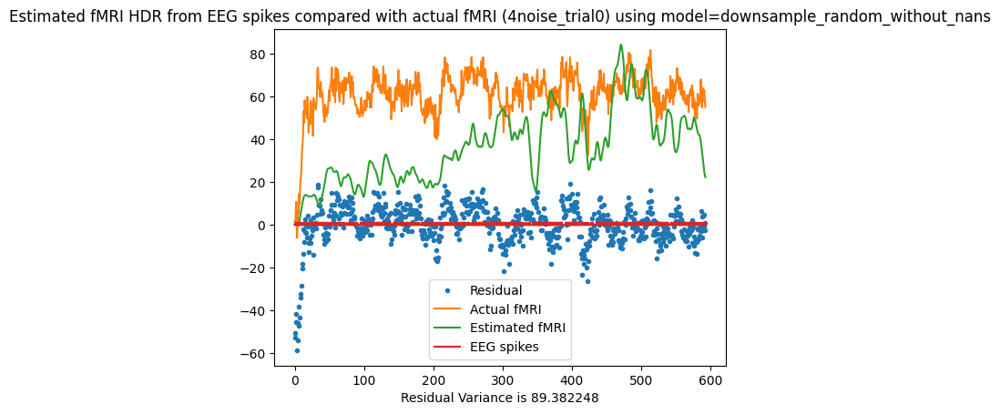

Residual Variance is 89.382248


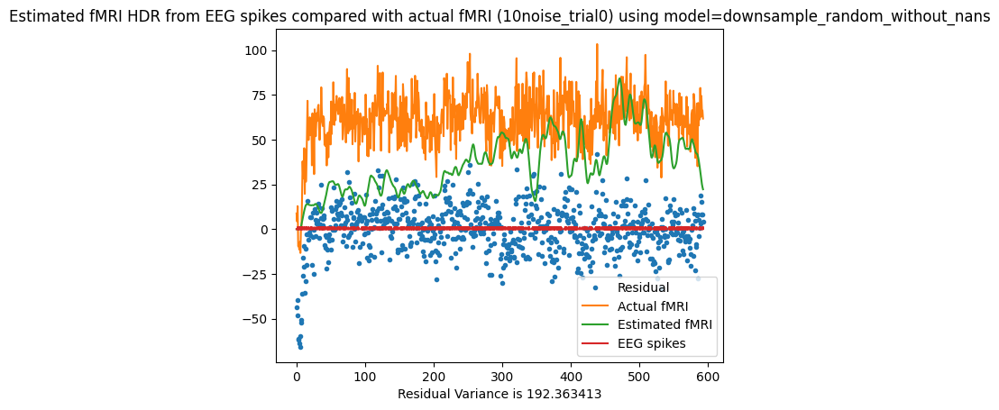

Residual Variance is 192.363413


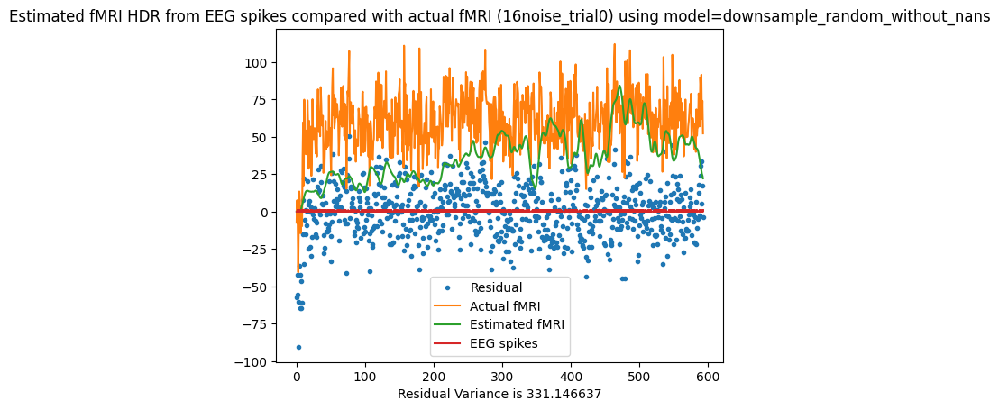

Residual Variance is 331.146637
Searching for optimal parameters!
Delta: 0.05000 (0.00%).
Delta: 0.30000 (4.76%). Last tau/alpha search took 3.49 seconds
Delta: 0.55000 (9.52%). Last tau/alpha search took 3.68 seconds
Delta: 0.80000 (14.29%). Last tau/alpha search took 3.70 seconds
Delta: 1.05000 (19.05%). Last tau/alpha search took 3.73 seconds
Delta: 1.30000 (23.81%). Last tau/alpha search took 3.80 seconds
Delta: 1.55000 (28.57%). Last tau/alpha search took 3.81 seconds
Delta: 1.80000 (33.33%). Last tau/alpha search took 3.80 seconds
Delta: 2.05000 (38.10%). Last tau/alpha search took 3.83 seconds
Delta: 2.30000 (42.86%). Last tau/alpha search took 3.76 seconds
Delta: 2.55000 (47.62%). Last tau/alpha search took 3.76 seconds
Delta: 2.80000 (52.38%). Last tau/alpha search took 3.76 seconds
Delta: 3.05000 (57.14%). Last tau/alpha search took 3.76 seconds
Delta: 3.30000 (61.90%). Last tau/alpha search took 3.88 seconds
Delta: 3.55000 (66.67%). Last tau/alpha search took 3.96 seconds
De

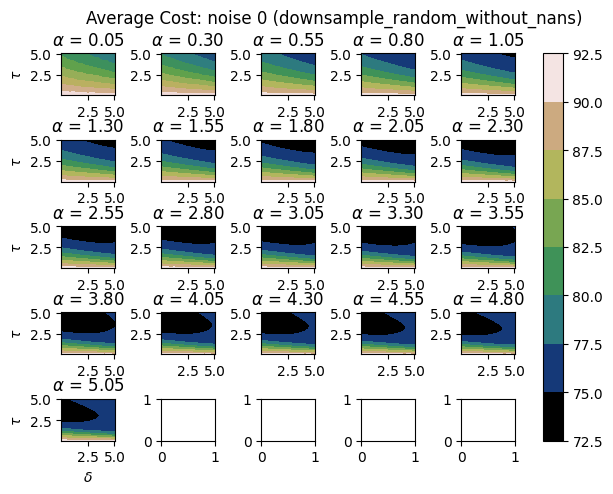

Minimal Cost for Average Cost: noise 1 (downsample_random_without_nans) = 74.89609527666414; at
     delta   tau  alpha
431   0.05  5.05    2.8


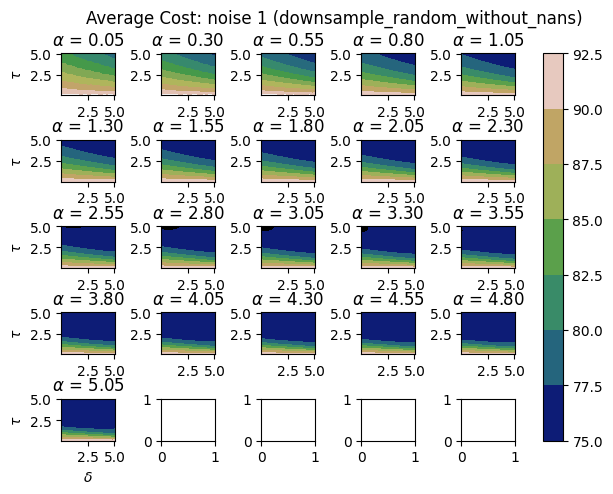

Minimal Cost for Average Cost: noise 4 (downsample_random_without_nans) = 89.93164155741256; at
     delta   tau  alpha
431   0.05  5.05    2.8


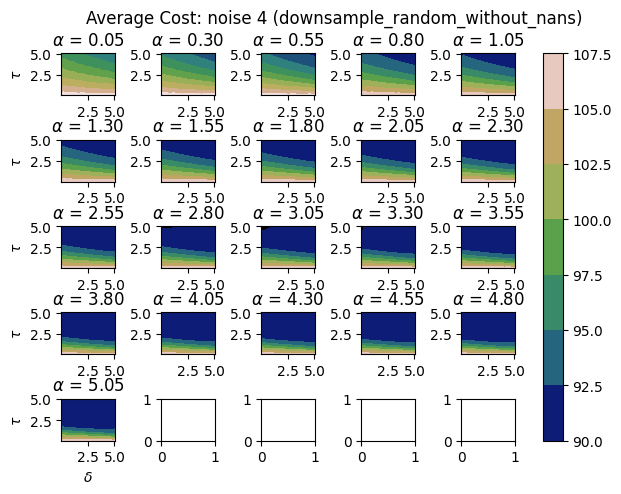

Minimal Cost for Average Cost: noise 7 (downsample_random_without_nans) = 122.71541292929987; at
     delta   tau  alpha
431   0.05  5.05    2.8


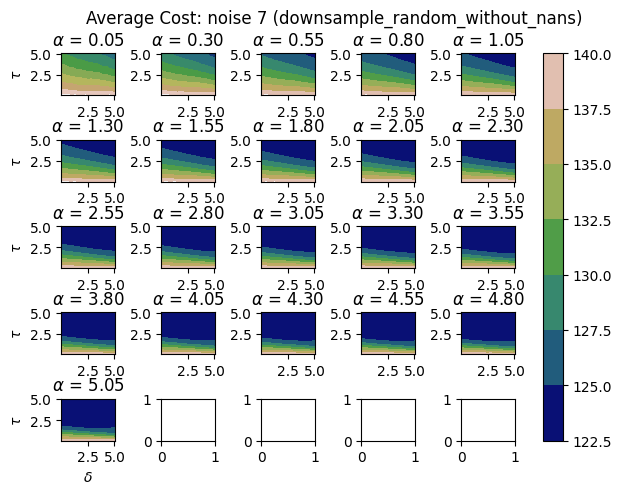

Minimal Cost for Average Cost: noise 10 (downsample_random_without_nans) = 174.0300832183528; at
     delta   tau  alpha
431   0.05  5.05    2.8


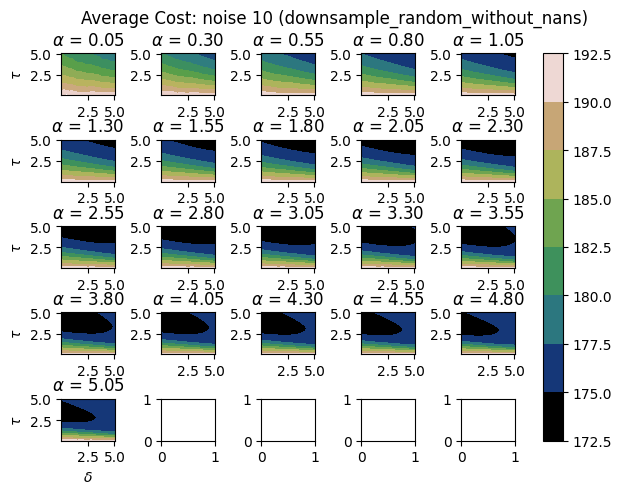

Minimal Cost for Average Cost: noise 13 (downsample_random_without_nans) = 243.1496638866307; at
     delta   tau  alpha
432   0.05  5.05   3.05


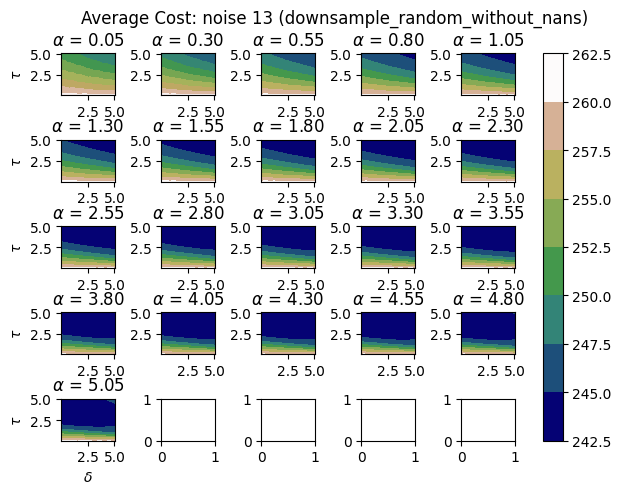

Minimal Cost for Average Cost: noise 16 (downsample_random_without_nans) = 328.07542778584025; at
     delta   tau  alpha
431   0.05  5.05    2.8


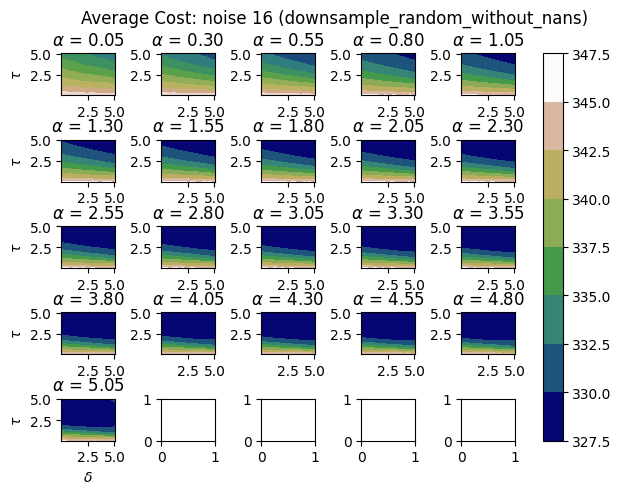

In [47]:
for i in range(num_models_to_generate):
    print(f'Expected delta: {expected_delta}, Expected tau: {expected_tau}, Expected alpha: {expected_alpha}')
    model_to_fmri = build_model_to_fmri(
        models_to_test,
        eeg_data_options_for_fmri_generation,
        expected_delta,
        expected_tau,
        expected_alpha,
        num_trials,
        num_trials_to_plot,
        noise_range,
        noises_to_plot,
        plot_perfect_comparison,
        tr,
        sample_freq,
        hemodynamic_response_window,
        plot_generated_data
    )
    models = build_models(
        model_to_fmri,
        eeg_data_options_for_simulation,
        tr, 
        n_trs_skipped_at_beginning,
        sample_freq,
        hemodynamic_response_window,
        plot
    )

    # Get in-depth plots for actual delta, tau, alpha
    for model_name, model in models.items():
        residual_var = model.score(expected_delta, expected_tau, expected_alpha)
        fmri_names = np.array(model.fmri.voxel_names)
        if (fmri_names == None).any():
            print(f'Residual variance was {residual_var}')
        model.plot = False
    
    print('Searching for optimal parameters!')
    descriptions, df = search_voxels(models, delta, tau, alpha)
    with open(f'{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}', 'w') as f:
        pd.DataFrame(df).to_csv(f)
    for model_name, description in zip(models.keys(), descriptions):
        description_filename = os.path.join(
            'Descriptions',
            f'{model_name}_summary_{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}'
        )
        with open(description_filename, 'w') as f:
            pd.DataFrame(description).transpose().to_csv(f)
    assert len(df['model_name'].unique()) == 1
    df_to_plot = df.drop(columns='model_name').astype(float)
    for noise in np.concatenate([[0], noise_range]):
        columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
        columns_for_noise = df_to_plot.columns[columns_to_choose]

        average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
        average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
        display_plot(plot_all_search_results_2d_on_same_colormap, average_df)

        # Grab parameters with the minimum cost
        minimum_cost_mask = df_to_plot[columns_for_noise] == df_to_plot[columns_for_noise].min()
        minimum_cost_array = df_to_plot[columns_for_noise][minimum_cost_mask].to_numpy()

        for point in zip(*np.where(~np.isnan(minimum_cost_array))):
            row_of_interest = df_to_plot.iloc[point[0]]
            data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])



## Cost by Noise

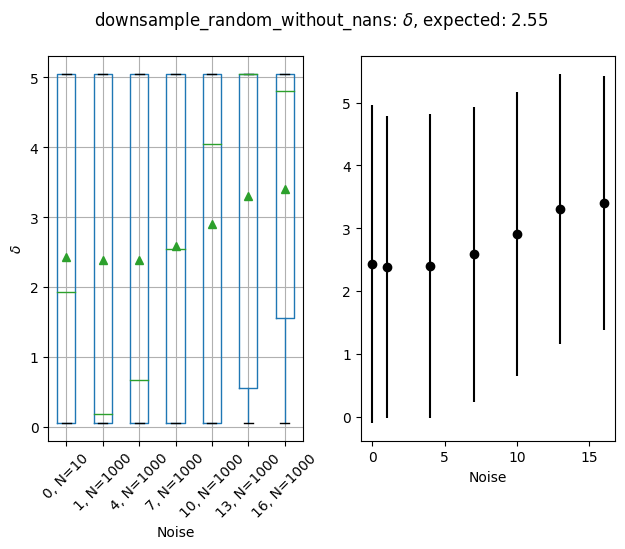

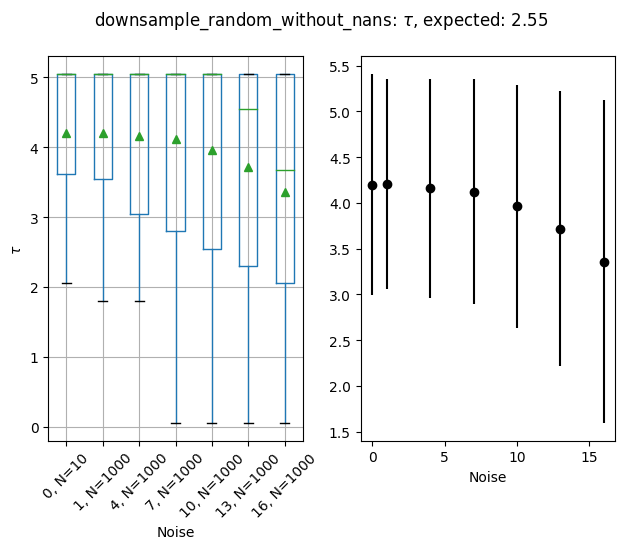

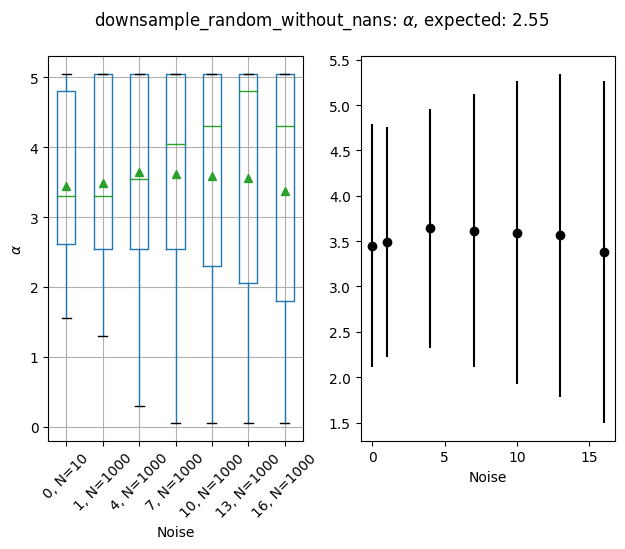

In [49]:
chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable, expected_val in [('delta', expected_delta), ('tau', expected_tau), ('alpha', expected_alpha)]:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(f'{model_name}: {generate_latex_label(variable)}, expected: {expected_val}')
    fig.tight_layout()
    axs[0].set_ylabel(generate_latex_label(variable))
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(
        np.concatenate([[0], noise_range]), 
        chosen_points.mean()[variable], 
        chosen_points.std()[variable], fmt='ok'
    )
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()
    